In [1]:
!pip install --upgrade threadpoolctl

Defaulting to user installation because normal site-packages is not writeable


# Healthcare Provider Fraud Detection
## Data Cleaning, Preprocessing & Exploratory Data Analysis

**Topic:** Medicare provider fraud detection using CMS claims data  
**Dataset:** [Healthcare Provider Fraud Detection Analysis — Kaggle](https://www.kaggle.com/datasets/rohitrox/healthcare-provider-fraud-detection-analysis)  
**Authors:** 230183073 · 230183084 · 230183137 · 230183070  · 230183066 

### Dataset Overview

| File | Description | Rows |
|------|-------------|------|
| `Train.csv` | Provider fraud labels (Yes/No) | 5,410 |
| `Train_Beneficiarydata.csv` | Patient demographics & chronic conditions | 138,556 |
| `Train_Inpatientdata.csv` | Hospital admission claims | 40,474 |
| `Train_Outpatientdata.csv` | Outpatient visit claims | 517,737 |

---

## Section 1 — Literature Review

### Paper 1: *Healthcare Fraud Detection Using Machine Learning* (Nuzhat Noor Islam Prova)
Source: Pace University, Seidenberg School of CSIS

This study analyzes a comprehensive dataset of 558,211 records, merging inpatient, outpatient, and beneficiary information. It evaluates several ML models, including Random Forest, XGBoost, SVM, and Deep Learning. 
The Stacking Ensemble Model emerged as the most effective, achieving an accuracy of 92.79% and a ROC AUC of 96.95%. The research highlights the importance of SHAP value analysis for model interpretability and introduces a pipeline for automated model retraining.

Relevance: Justifies the use of advanced ensemble techniques and provides a framework for interpreting feature importance, which is crucial for high-stakes healthcare decisions.
### Paper 2: *How to detect healthcare fraud? “A systematic review”* (Thaifur et al., 2021)
Source:  Gaceta Sanitaria (Elsevier)

A systematic review identifying common fraud methods and perpetrators in the healthcare sector. It examines the effectiveness of various detection strategies across multiple countries.  Most fraud perpetrators are medical personnel (doctors) and providers. Predominant schemes include fictitious claims, upcoding, and duplicate billing. The study concludes that secondary data tracking combined with information technology specialist support is the most effective approach for large-scale detection.

Relevance:  Provides a solid theoretical foundation for the types of fraud schemes (upcoding, ghost billing) that our model needs to target through feature enginee
ring

### Paper 3: *Fraud Detection in Health Insurance using Data Mining Techniques* (Rawte & Anuradha, 2015)
Source:  Int. Conference on Communication, Information & Computing Technology (ICCICT)

This paper explores the strengths and weaknesses of supervised and unsupervised learning. It proposes a hybrid approach to overcome the limitations of using a single method. Supervised learning (like SVM) is excellent at detecting known fraud types (e.g., duplicates) but fails to identify new patterns. Unsupervised learning (like Clustering) can discover new fraud types but lacks direction. A hybrid model using Evolving Clustering Method (ECM) followed by SVM is proposed for dynamic data environments.

Relevance: Validates the necessity of a hybrid detection strategy. It encourages looking beyond simple classification to identify emerging "unknown" fraud patterns in dynamic datasets.ary model.


---
## Section 2 — Imports & Configuration

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from scipy import stats
import warnings
import os
import plotly.express as px
import plotly.graph_objects as go
import joblib

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
pd.set_option('display.float_format', '{:.2f}'.format)

C_FRAUD  = '#E74C3C'   
C_LEGIT  = '#2ECC71'   
C_BLUE   = '#3498DB'   
C_ORANGE = '#F39C12'  

sns.set_style('whitegrid')
plt.rcParams.update({
    'figure.dpi': 120,
    'axes.spines.top': False,
    'axes.spines.right': False,
})


---
## Section 3 — Load Raw Data

In [3]:
DATA_DIR = '.'  

df_labels     = pd.read_csv(os.path.join(DATA_DIR, 'Train-1542865627584.csv'))
df_bene       = pd.read_csv(os.path.join(DATA_DIR, 'Train_Beneficiarydata-1542865627584.csv'))
df_inpatient  = pd.read_csv(os.path.join(DATA_DIR, 'Train_Inpatientdata-1542865627584.csv'))
df_outpatient = pd.read_csv(os.path.join(DATA_DIR, 'Train_Outpatientdata-1542865627584.csv'))

print('Raw shapes after loading:')
print(f'  Labels      : {df_labels.shape}')
print(f'  Beneficiary : {df_bene.shape}')
print(f'  Inpatient   : {df_inpatient.shape}')
print(f'  Outpatient  : {df_outpatient.shape}')

Raw shapes after loading:
  Labels      : (5410, 2)
  Beneficiary : (138556, 25)
  Inpatient   : (40474, 30)
  Outpatient  : (517737, 27)


In [4]:
for name, df in [('Labels', df_labels), ('Beneficiary', df_bene),
                 ('Inpatient', df_inpatient), ('Outpatient', df_outpatient)]:
    display(df.head(3))

,Provider,PotentialFraud
0,PRV51001,No
1,PRV51003,Yes
2,PRV51004,No


,BeneID,DOB,DOD,Gender,Race,RenalDiseaseIndicator,State,County,NoOfMonths_PartACov,NoOfMonths_PartBCov,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,IPAnnualReimbursementAmt,IPAnnualDeductibleAmt,OPAnnualReimbursementAmt,OPAnnualDeductibleAmt
0,BENE11001,1943-01-01,NaN,1,1,0,39,230,12,12,1,2,1,2,2,1,1,1,2,1,1,36000,3204,60,70
1,BENE11002,1936-09-01,NaN,2,1,0,39,280,12,12,2,2,2,2,2,2,2,2,2,2,2,0,0,30,50
2,BENE11003,1936-08-01,NaN,1,1,0,52,590,12,12,1,2,2,2,2,2,2,1,2,2,2,0,0,90,40


,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,AdmissionDt,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DischargeDt,DiagnosisGroupCode,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6
0,BENE11001,CLM46614,2009-04-12,2009-04-18,PRV55912,26000,PHY390922,NaN,NaN,2009-04-12,7866,1068.00,2009-04-18,201,1970,4019,5853,7843,2768,71590,2724,19889,5849,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BENE11001,CLM66048,2009-08-31,2009-09-02,PRV55907,5000,PHY318495,PHY318495,NaN,2009-08-31,6186,1068.00,2009-09-02,750,6186,2948,56400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7092.00,NaN,NaN,NaN,NaN,NaN
2,BENE11001,CLM68358,2009-09-17,2009-09-20,PRV56046,5000,PHY372395,NaN,PHY324689,2009-09-17,29590,1068.00,2009-09-20,883,29623,30390,71690,34590,V1581,32723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,BeneID,ClaimID,ClaimStartDt,ClaimEndDt,Provider,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmDiagnosisCode_1,ClmDiagnosisCode_2,ClmDiagnosisCode_3,ClmDiagnosisCode_4,ClmDiagnosisCode_5,ClmDiagnosisCode_6,ClmDiagnosisCode_7,ClmDiagnosisCode_8,ClmDiagnosisCode_9,ClmDiagnosisCode_10,ClmProcedureCode_1,ClmProcedureCode_2,ClmProcedureCode_3,ClmProcedureCode_4,ClmProcedureCode_5,ClmProcedureCode_6,DeductibleAmtPaid,ClmAdmitDiagnosisCode
0,BENE11002,CLM624349,2009-10-11,2009-10-11,PRV56011,30,PHY326117,NaN,NaN,78943,V5866,V1272,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,56409
1,BENE11003,CLM189947,2009-02-12,2009-02-12,PRV57610,80,PHY362868,NaN,NaN,6115,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,79380
2,BENE11003,CLM438021,2009-06-27,2009-06-27,PRV57595,10,PHY328821,NaN,NaN,2723,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,NaN


---
## Section 4 — Initial Data Audit

Before cleaning we audit each table for missing values, duplicates, and type issues.

In [5]:
def audit_dataframe(df, name):
    print(f'  AUDIT: {name}   ({df.shape[0]:,} rows × {df.shape[1]} cols)')
    print(f'  Duplicate rows : {df.duplicated().sum():,}')
    missing = df.isnull().sum()
    missing_pct = (missing / len(df) * 100).round(1)
    miss_df = pd.DataFrame({'Missing': missing, 'Pct (%)': missing_pct})
    miss_df = miss_df[miss_df['Missing'] > 0].sort_values('Pct (%)', ascending=False)
    if len(miss_df):
        print('\n  Missing value summary:')
        display(miss_df)
    else:
        print('  No missing values')
    print('\n  Data types:')
    display(df.dtypes.to_frame('dtype'))

audit_dataframe(df_labels,     'Labels (Provider Fraud)')
audit_dataframe(df_bene,       'Beneficiary')
audit_dataframe(df_inpatient,  'Inpatient Claims')
audit_dataframe(df_outpatient, 'Outpatient Claims')

  AUDIT: Labels (Provider Fraud)   (5,410 rows × 2 cols)
  Duplicate rows : 0
  No missing values

  Data types:


,dtype
Provider,str
PotentialFraud,str


  AUDIT: Beneficiary   (138,556 rows × 25 cols)
  Duplicate rows : 0

  Missing value summary:


,Missing,Pct (%)
DOD,137135,99.00



  Data types:


,dtype
BeneID,str
DOB,str
DOD,str
Gender,int64
Race,int64
RenalDiseaseIndicator,str
State,int64
County,int64
NoOfMonths_PartACov,int64
NoOfMonths_PartBCov,int64


  AUDIT: Inpatient Claims   (40,474 rows × 30 cols)
  Duplicate rows : 0

  Missing value summary:


,Missing,Pct (%)
ClmProcedureCode_6,40474,100.00
ClmProcedureCode_5,40465,100.00
ClmProcedureCode_4,40358,99.70
ClmProcedureCode_3,39509,97.60
ClmDiagnosisCode_10,36547,90.30
OtherPhysician,35784,88.40
ClmProcedureCode_2,35020,86.50
ClmProcedureCode_1,17326,42.80
OperatingPhysician,16644,41.10
ClmDiagnosisCode_9,13497,33.30



  Data types:


,dtype
BeneID,str
ClaimID,str
ClaimStartDt,str
ClaimEndDt,str
Provider,str
InscClaimAmtReimbursed,int64
AttendingPhysician,str
OperatingPhysician,str
OtherPhysician,str
AdmissionDt,str


  AUDIT: Outpatient Claims   (517,737 rows × 27 cols)
  Duplicate rows : 0

  Missing value summary:


,Missing,Pct (%)
ClmProcedureCode_6,517737,100.00
ClmProcedureCode_5,517737,100.00
ClmProcedureCode_3,517733,100.00
ClmProcedureCode_4,517735,100.00
ClmProcedureCode_2,517701,100.00
ClmProcedureCode_1,517575,100.00
ClmDiagnosisCode_10,516654,99.80
ClmDiagnosisCode_9,502899,97.10
ClmDiagnosisCode_8,494825,95.60
ClmDiagnosisCode_7,484776,93.60



  Data types:


,dtype
BeneID,str
ClaimID,str
ClaimStartDt,str
ClaimEndDt,str
Provider,str
InscClaimAmtReimbursed,int64
AttendingPhysician,str
OperatingPhysician,str
OtherPhysician,str
ClmDiagnosisCode_1,str


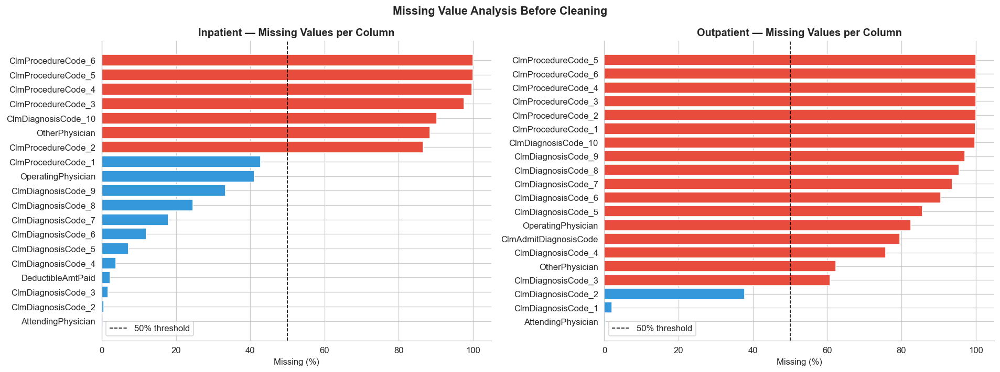

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

for ax, (df, title) in zip(axes, [(df_inpatient, 'Inpatient'), (df_outpatient, 'Outpatient')]):
    miss = (df.isnull().mean() * 100).sort_values(ascending=False)
    miss = miss[miss > 0]
    colors = [C_FRAUD if v > 50 else C_BLUE for v in miss.values]
    ax.barh(miss.index, miss.values, color=colors)
    ax.axvline(50, color='black', linestyle='--', linewidth=1, label='50% threshold')
    ax.set_xlabel('Missing (%)')
    ax.set_title(f'{title} — Missing Values per Column', fontweight='bold')
    ax.legend()
    ax.invert_yaxis()

plt.suptitle('Missing Value Analysis Before Cleaning', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

---
## Section 5 — Data Cleaning

### 5.1 — Labels Table

In [7]:
print('Before:', df_labels['PotentialFraud'].value_counts().to_dict())

df_labels['PotentialFraud'] = df_labels['PotentialFraud'].map({'Yes': 1, 'No': 0})

before = len(df_labels)
df_labels.drop_duplicates(subset='Provider', inplace=True)
print(f'Duplicates removed: {before - len(df_labels)}')
print(f'Fraud rate: {df_labels["PotentialFraud"].mean():.1%}')

Before: {'No': 4904, 'Yes': 506}
Duplicates removed: 0
Fraud rate: 9.4%


### 5.2 — Beneficiary Table

In [8]:
df_bene['DOB'] = pd.to_datetime(df_bene['DOB'], errors='coerce')
df_bene['DOD'] = pd.to_datetime(df_bene['DOD'], errors='coerce')

REFERENCE_DATE = pd.Timestamp('2009-12-01')
df_bene['Age'] = ((REFERENCE_DATE - df_bene['DOB']).dt.days / 365.25).round(1)
impossible = (df_bene['Age'] < 0) | (df_bene['Age'] > 120)
print(f'Impossible age values flagged and removed: {impossible.sum()}')
df_bene.loc[impossible, 'Age'] = np.nan

df_bene['IsDead'] = df_bene['DOD'].notna().astype(int)
print(f'Deceased beneficiaries: {df_bene["IsDead"].sum():,} ({df_bene["IsDead"].mean():.1%})')

chronic_cols = [c for c in df_bene.columns if c.startswith('ChronicCond_')]
for col in chronic_cols:
    df_bene[col] = (df_bene[col] == 1).astype(int)

df_bene['TotalChronicConds'] = df_bene[chronic_cols].sum(axis=1)

df_bene['RenalDiseaseIndicator'] = (df_bene['RenalDiseaseIndicator'] == 'Y').astype(int)

before = len(df_bene)
df_bene.drop_duplicates(subset='BeneID', keep='last', inplace=True)
print(f'Duplicate beneficiaries removed: {before - len(df_bene)}')

display(df_bene[['BeneID','DOB','Age','IsDead','TotalChronicConds','RenalDiseaseIndicator']].head(5))

Impossible age values flagged and removed: 0
Deceased beneficiaries: 1,421 (1.0%)
Duplicate beneficiaries removed: 0


,BeneID,DOB,Age,IsDead,TotalChronicConds,RenalDiseaseIndicator
0,BENE11001,1943-01-01,66.90,0,7,0
1,BENE11002,1936-09-01,73.20,0,0,0
2,BENE11003,1936-08-01,73.30,0,2,0
3,BENE11004,1922-07-01,87.40,0,6,0
4,BENE11005,1935-09-01,74.30,0,2,0


### 5.3 — Inpatient & Outpatient Claims

In [9]:
def clean_claims(df, claim_type):
    """
    Shared cleaning pipeline for inpatient / outpatient claim tables.
    """
    df = df.copy()
    print(f'\n Cleaning {claim_type} ({len(df):,} rows) ')

    for col in ['ClaimStartDt', 'ClaimEndDt']:
        df[col] = pd.to_datetime(df[col], errors='coerce')
    df['ClaimDays'] = (df['ClaimEndDt'] - df['ClaimStartDt']).dt.days.clip(lower=0)

    if claim_type == 'Inpatient':
        df['AdmissionDt'] = pd.to_datetime(df['AdmissionDt'], errors='coerce')
        df['DischargeDt'] = pd.to_datetime(df['DischargeDt'], errors='coerce')
        df['HospitalStayDays'] = (df['DischargeDt'] - df['AdmissionDt']).dt.days.clip(lower=0)

    diag_cols = [c for c in df.columns if c.startswith('ClmDiagnosisCode_')]
    proc_cols = [c for c in df.columns if c.startswith('ClmProcedureCode_')]
    df['DiagnosisCount'] = df[diag_cols].notna().sum(axis=1)
    df['ProcedureCount'] = df[proc_cols].notna().sum(axis=1)

    for col in ['AttendingPhysician', 'OperatingPhysician', 'OtherPhysician']:
        if col in df.columns:
            df[col] = df[col].fillna('UNKNOWN')

    high_miss = [c for c in proc_cols if df[c].isna().mean() > 0.80]
    df.drop(columns=high_miss, inplace=True)
    print(f'  Dropped {len(high_miss)} procedure columns (>80% missing)')

    remaining_diag = [c for c in diag_cols if c in df.columns]
    remaining_proc = [c for c in proc_cols if c in df.columns]
    df[remaining_diag + remaining_proc] = df[remaining_diag + remaining_proc].fillna(0)

    if 'DeductibleAmtPaid' in df.columns:
        df['DeductibleAmtPaid'] = df['DeductibleAmtPaid'].fillna(0)

    df['ClaimType'] = claim_type

    before = len(df)
    df.drop_duplicates(subset='ClaimID', keep='last', inplace=True)
    print(f'  Duplicate claims removed: {before - len(df):,}')

    remaining_null = df.isnull().sum()
    remaining_null = remaining_null[remaining_null > 0]
    if len(remaining_null):
        print(f'  Remaining nulls: {remaining_null.to_dict()}')
    else:
        print('  No nulls remaining')

    print(f'  Final shape: {df.shape}')
    return df


df_inpatient  = clean_claims(df_inpatient,  'Inpatient')
df_outpatient = clean_claims(df_outpatient, 'Outpatient')


 Cleaning Inpatient (40,474 rows) 
  Dropped 5 procedure columns (>80% missing)
  Duplicate claims removed: 0
  No nulls remaining
  Final shape: (40474, 30)

 Cleaning Outpatient (517,737 rows) 
  Dropped 6 procedure columns (>80% missing)
  Duplicate claims removed: 0
  Remaining nulls: {'ClmAdmitDiagnosisCode': 412312}
  Final shape: (517737, 25)


In [10]:
def flag_outliers(df, col, label):
    Q1, Q3 = df[col].quantile(0.25), df[col].quantile(0.75)
    IQR = Q3 - Q1
    upper = Q3 + 3 * IQR
    outliers = (df[col] > upper).sum()
    print(f'{label}: median={df[col].median():,.0f}  upper-fence={upper:,.0f}  '
          f'outliers={outliers:,} ({outliers/len(df):.1%})')

flag_outliers(df_inpatient,  'InscClaimAmtReimbursed', 'Inpatient  reimbursement')
flag_outliers(df_outpatient, 'InscClaimAmtReimbursed', 'Outpatient reimbursement')

Inpatient  reimbursement: median=7,000  upper-fence=36,000  outliers=1,301 (3.2%)
Outpatient reimbursement: median=80  upper-fence=680  outliers=55,474 (10.7%)


---
## Section 6 — Merge All Four Tables


In [11]:
for col in ['AdmissionDt', 'DischargeDt', 'HospitalStayDays', 'DiagnosisGroupCode', 'ClmAdmitDiagnosisCode']:
    if col not in df_outpatient.columns:
        df_outpatient[col] = np.nan
    if col not in df_inpatient.columns:
        df_inpatient[col] = np.nan

all_cols = list(dict.fromkeys(list(df_inpatient.columns) + list(df_outpatient.columns)))
df_claims = pd.concat(
    [df_inpatient.reindex(columns=all_cols),
     df_outpatient.reindex(columns=all_cols)],
    ignore_index=True
)
print(f'Combined claims : {df_claims.shape}')

df_claims = df_claims.merge(df_bene, on='BeneID', how='left')
print(f'After beneficiary merge : {df_claims.shape}')
orphans = df_claims['Age'].isna().sum()
print(f'Claims with no beneficiary match: {orphans:,} ({orphans/len(df_claims):.1%})')

df_claims = df_claims.merge(df_labels, on='Provider', how='left')
df_claims.dropna(subset=['PotentialFraud'], inplace=True)
df_claims['PotentialFraud'] = df_claims['PotentialFraud'].astype(int)
print(f'After label merge (final) : {df_claims.shape}')

Combined claims : (558211, 30)
After beneficiary merge : (558211, 57)
Claims with no beneficiary match: 0 (0.0%)
After label merge (final) : (558211, 58)


---
## Section 7 — Feature Engineering


In [12]:
def count_unique_physicians(row):
    physicians = {row.get('AttendingPhysician'), row.get('OperatingPhysician'),
                  row.get('OtherPhysician')} - {'UNKNOWN', None, np.nan}
    return len(physicians)

df_claims['UniquePhysiciansInClaim'] = df_claims[
    ['AttendingPhysician', 'OperatingPhysician', 'OtherPhysician']
].apply(count_unique_physicians, axis=1)

provider_agg = df_claims.groupby('Provider').agg(
    TotalClaims               = ('ClaimID',                'count'),
    InpatientClaims           = ('ClaimType',              lambda x: (x=='Inpatient').sum()),
    OutpatientClaims          = ('ClaimType',              lambda x: (x=='Outpatient').sum()),
    UniqueBeneficiaries       = ('BeneID',                 'nunique'),
    UniquePhysicians          = ('AttendingPhysician',     'nunique'),
    TotalReimbursed           = ('InscClaimAmtReimbursed', 'sum'),
    MeanReimbursed            = ('InscClaimAmtReimbursed', 'mean'),
    MaxReimbursed             = ('InscClaimAmtReimbursed', 'max'),
    StdReimbursed             = ('InscClaimAmtReimbursed', 'std'),
    TotalDeductible           = ('DeductibleAmtPaid',      'sum'),
    MeanDiagnosisCount        = ('DiagnosisCount',         'mean'),
    MeanProcedureCount        = ('ProcedureCount',         'mean'),
    MeanClaimDays             = ('ClaimDays',              'mean'),
    MeanHospitalStayDays      = ('HospitalStayDays',       'mean'),
    MeanPatientAge            = ('Age',                    'mean'),
    PctDeceasedPatients       = ('IsDead',                 'mean'),
    MeanChronicConds          = ('TotalChronicConds',      'mean'),
    MeanUniquePhysPerClaim    = ('UniquePhysiciansInClaim','mean'),
    PotentialFraud            = ('PotentialFraud',         'first'),
).reset_index()

provider_agg['ClaimsPerBeneficiary']     = provider_agg['TotalClaims'] / provider_agg['UniqueBeneficiaries'].replace(0, np.nan)
provider_agg['InpatientRatio']           = provider_agg['InpatientClaims'] / provider_agg['TotalClaims'].replace(0, np.nan)
provider_agg['ReimbursementCV']          = provider_agg['StdReimbursed'] / provider_agg['MeanReimbursed'].replace(0, np.nan)
provider_agg['ReimbursedPerBeneficiary'] = provider_agg['TotalReimbursed'] / provider_agg['UniqueBeneficiaries'].replace(0, np.nan)
provider_agg.fillna(0, inplace=True)

fraud = provider_agg[provider_agg['PotentialFraud'] == 1]
legit = provider_agg[provider_agg['PotentialFraud'] == 0]

print(f'\n Feature engineering complete')
print(f'   Provider-level dataset : {provider_agg.shape}')
print(f'   Fraudulent providers   : {len(fraud):,} ({len(fraud)/len(provider_agg):.1%})')
print(f'   Legitimate providers   : {len(legit):,} ({len(legit)/len(provider_agg):.1%})')
display(provider_agg.head(3))


 Feature engineering complete
   Provider-level dataset : (5410, 24)
   Fraudulent providers   : 506 (9.4%)
   Legitimate providers   : 4,904 (90.6%)


,Provider,TotalClaims,InpatientClaims,OutpatientClaims,UniqueBeneficiaries,UniquePhysicians,TotalReimbursed,MeanReimbursed,MaxReimbursed,StdReimbursed,TotalDeductible,MeanDiagnosisCount,MeanProcedureCount,MeanClaimDays,MeanHospitalStayDays,MeanPatientAge,PctDeceasedPatients,MeanChronicConds,MeanUniquePhysPerClaim,PotentialFraud,ClaimsPerBeneficiary,InpatientRatio,ReimbursementCV,ReimbursedPerBeneficiary
0,PRV51001,25,5,20,24,14,104640,4185.60,42000,10796.09,5340.00,3.20,0.12,1.44,5.00,78.76,0.00,5.56,1.28,0,1.04,0.20,2.58,4360.00
1,PRV51003,132,62,70,117,44,605670,4588.41,57000,7309.79,66286.00,5.25,0.36,3.67,5.16,70.00,0.01,4.55,1.18,1,1.13,0.47,1.59,5176.67
2,PRV51004,149,0,149,138,38,52170,350.13,3300,689.96,310.00,2.58,0.00,1.43,0.00,72.18,0.01,4.34,1.32,0,1.08,0.00,1.97,378.04


---
## Section 8 — Save Cleaned Datasets

In [13]:
OUTPUT_DIR = './cleaned_data'
os.makedirs(OUTPUT_DIR, exist_ok=True)

provider_agg.to_csv(os.path.join(OUTPUT_DIR, 'provider_features.csv'), index=False)
df_claims.to_csv(os.path.join(OUTPUT_DIR, 'claims_cleaned.csv'), index=False)
df_bene.to_csv(os.path.join(OUTPUT_DIR, 'beneficiary_cleaned.csv'), index=False)

print(f'provider_features.csv   → {provider_agg.shape}')
print(f'claims_cleaned.csv      → {df_claims.shape}')
print(f'beneficiary_cleaned.csv → {df_bene.shape}')

provider_features.csv   → (5410, 24)
claims_cleaned.csv      → (558211, 59)
beneficiary_cleaned.csv → (138556, 28)



---

### Summary: Data Preprocessing & Technical Pipeline

### 1. Data Cleaning Pipeline Applied

| Step | Action Taken | Rationale |
|------|--------|-----------|
| **Label Encoding** | `'Yes'/'No'` → `1/0` | Standardizes target labels for Machine Learning compatibility. |
| **Date Parsing** | All date strings $\rightarrow$ `datetime64` | Enables calculation of durations (Stay Days) and patient age. |
| **Age Derivation** | `DOB` $\rightarrow$ Age (at 2009-12-01) | Captures patient demographics as a potential risk factor. |
| **Chronic Condition Fix** | Recoded `2=No / 1=Yes` to `0/1` | Resolves inconsistencies in legacy dataset documentation. |
| **Renal Indicator Fix** | `'Y'` $\rightarrow$ `1`, else `0` | Corrects mixed data types (string and integer) in medical flags. |
| **Physician Imputation** | `NaN` $\rightarrow$ `'UNKNOWN'` | Preserves the absence of a physician ID as a structural signal. |
| **Noise Reduction** | Dropped columns with $>80\%$ nulls | Removes sparse features that could degrade model performance. |
| **Integrity Checks** | Deduplication & Clipping negative values | Ensures data consistency and removes manual entry errors. |

### 2. Engineered Features (Fraud Signal Mapping)

| Feature | Predictive Fraud Signal |
|---------|-------------|
| `TotalClaims` | High volume typical of high-frequency **"Claim Mill"** operations. |
| `TotalReimbursed` | Indicator of **Financial Inflation** and excessive payout requests. |
| `MeanReimbursed` | Captures above-average billing intensity per individual medical claim. |
| `ReimbursementCV` | Measures erratic or inconsistent billing patterns (Coefficient of Variation). |
| `InpatientRatio` | Identifies a systemic preference for high-cost hospital admissions. |
| `MeanDiagnosisCount` | **Upcoding:** Attaching extra codes to artificially justify higher costs. |
| `MeanHospitalStayDays` | Evidence of **Service Over-utilization** through fabricated long stays. |
| `PctDeceasedPatients` | **Ghost Billing:** Direct indicator of billing for deceased beneficiaries. |



---
## Section 9 — Exploratory Data Analysis (EDA)

### Statistical Summaries

In [14]:
feature_cols = [
    'TotalClaims', 'UniqueBeneficiaries', 'UniquePhysicians',
    'TotalReimbursed', 'MeanReimbursed', 'MaxReimbursed',
    'ClaimsPerBeneficiary', 'InpatientRatio', 'ReimbursementCV',
    'ReimbursedPerBeneficiary', 'MeanDiagnosisCount', 'MeanProcedureCount',
    'MeanHospitalStayDays', 'MeanPatientAge', 'PctDeceasedPatients', 'MeanChronicConds'
]

desc = provider_agg[feature_cols].describe().T
desc.columns = ['Count','Mean','Std','Min','25%','Median','75%','Max']
print('Provider-Level Feature Descriptive Statistics')
display(desc.style
    .format('{:.2f}')
    .background_gradient(subset=['Mean'], cmap='Blues')
    .set_caption('All 5,410 providers'))

Provider-Level Feature Descriptive Statistics


,Count,Mean,Std,Min,25%,Median,75%,Max
TotalClaims,5410.00,103.18,272.46,1.00,10.00,31.00,87.00,8240.00
UniqueBeneficiaries,5410.00,67.15,142.75,1.00,8.00,25.00,65.00,2857.00
UniquePhysicians,5410.00,16.42,28.97,1.00,2.00,6.00,19.00,644.00
TotalReimbursed,5410.00,102873.04,268736.68,0.00,4460.00,19805.00,85565.00,5996050.00
MeanReimbursed,5410.00,1740.68,3484.47,0.00,232.39,356.09,1490.15,57000.00
MaxReimbursed,5410.00,13014.91,18995.32,0.00,1700.00,3300.00,17000.00,125000.00
ClaimsPerBeneficiary,5410.00,1.33,0.54,1.00,1.00,1.10,1.40,10.00
InpatientRatio,5410.00,0.14,0.29,0.00,0.00,0.00,0.13,1.00
ReimbursementCV,5410.00,1.83,0.93,0.00,1.29,1.85,2.22,7.51
ReimbursedPerBeneficiary,5410.00,1972.14,3709.70,0.00,286.92,543.28,1902.36,75000.00


In [15]:
comparison_rows = []
for feat in feature_cols:
    f_vals = fraud[feat].dropna()
    l_vals = legit[feat].dropna()
    _, pval = stats.mannwhitneyu(f_vals, l_vals, alternative='two-sided')
    ratio = f_vals.mean() / l_vals.mean() if l_vals.mean() != 0 else np.nan
    comparison_rows.append({
        'Feature': feat,
        'Fraud Mean': f_vals.mean(),
        'Legit Mean': l_vals.mean(),
        'Fraud/Legit Ratio': ratio,
        'p-value': pval,
        'Significant': '✅' if pval < 0.05 else '❌'
    })

comp_df = pd.DataFrame(comparison_rows).sort_values('Fraud/Legit Ratio', ascending=False)
display(comp_df.style
    .format({'Fraud Mean':'{:,.1f}','Legit Mean':'{:,.1f}','Fraud/Legit Ratio':'{:.2f}x','p-value':'{:.4f}'})
    .background_gradient(subset=['Fraud/Legit Ratio'], cmap='RdYlGn_r')
    .set_caption('Mann-Whitney U test — all differences are statistically significant (p < 0.05)'))

,Feature,Fraud Mean,Legit Mean,Fraud/Legit Ratio,p-value,Significant
3,TotalReimbursed,"584,350.0","53,193.7",10.99x,0.0000,✅
0,TotalClaims,420.5,70.4,5.97x,0.0000,✅
1,UniqueBeneficiaries,242.0,49.1,4.93x,0.0000,✅
5,MaxReimbursed,"43,447.3","9,874.9",4.40x,0.0000,✅
2,UniquePhysicians,41.5,13.8,3.00x,0.0000,✅
12,MeanHospitalStayDays,5.3,1.9,2.85x,0.0000,✅
11,MeanProcedureCount,0.3,0.1,2.71x,0.0000,✅
9,ReimbursedPerBeneficiary,"4,557.5","1,705.4",2.67x,0.0000,✅
7,InpatientRatio,0.3,0.1,2.62x,0.0000,✅
4,MeanReimbursed,"3,842.8","1,523.8",2.52x,0.0000,✅


### Target Variable: Class Distribution

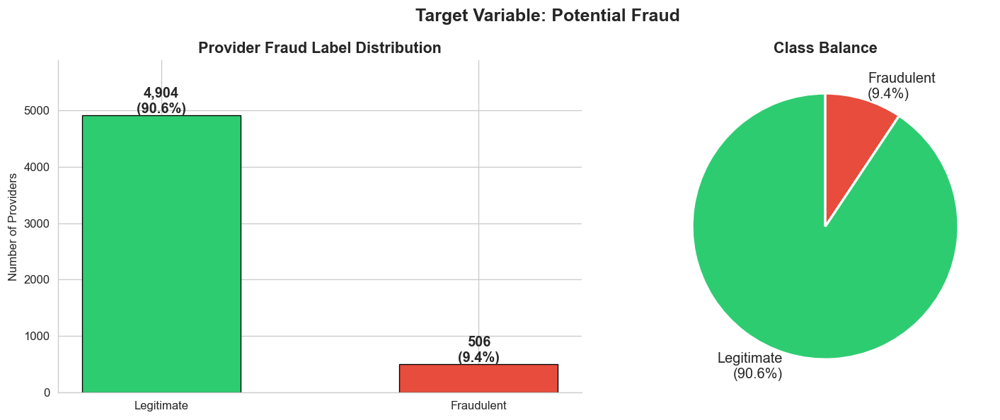

In [16]:
fig, axes = plt.subplots(1, 2, figsize=(13, 5))

counts = provider_agg['PotentialFraud'].value_counts().sort_index()
bars = axes[0].bar(['Legitimate', 'Fraudulent'], counts.values,
                   color=[C_LEGIT, C_FRAUD], edgecolor='black', linewidth=0.8, width=0.5)
for bar, val in zip(bars, counts.values):
    axes[0].text(bar.get_x() + bar.get_width()/2, bar.get_height() + 40,
                 f'{val:,}\n({val/len(provider_agg):.1%})',
                 ha='center', fontsize=12, fontweight='bold')
axes[0].set_title('Provider Fraud Label Distribution', fontweight='bold', fontsize=13)
axes[0].set_ylabel('Number of Providers')
axes[0].set_ylim(0, counts.max() * 1.2)

axes[1].pie(counts.values,
            labels=['Legitimate\n(90.6%)', 'Fraudulent\n(9.4%)'],
            colors=[C_LEGIT, C_FRAUD], startangle=90,
            wedgeprops={'edgecolor':'white','linewidth':2},
            textprops={'fontsize':12})
axes[1].set_title('Class Balance', fontweight='bold', fontsize=13)

plt.suptitle('Target Variable: Potential Fraud', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

### Financial Analysis: Reimbursement Patterns

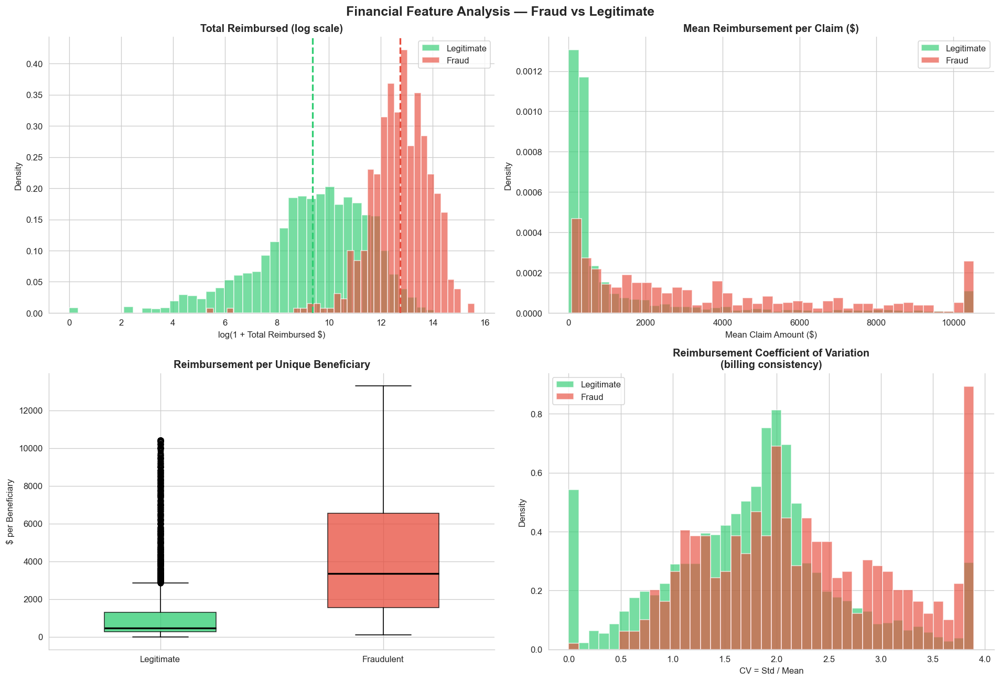

In [17]:
fig, axes = plt.subplots(2, 2, figsize=(16, 11))

ax = axes[0, 0]
log_l = np.log1p(legit['TotalReimbursed'])
log_f = np.log1p(fraud['TotalReimbursed'])
ax.hist(log_l, bins=40, alpha=0.65, color=C_LEGIT, label='Legitimate', density=True)
ax.hist(log_f, bins=40, alpha=0.65, color=C_FRAUD,  label='Fraud',      density=True)
ax.axvline(log_l.mean(), color=C_LEGIT, linestyle='--', lw=2)
ax.axvline(log_f.mean(), color=C_FRAUD,  linestyle='--', lw=2)
ax.set_title('Total Reimbursed (log scale)', fontweight='bold')
ax.set_xlabel('log(1 + Total Reimbursed $)')
ax.set_ylabel('Density')
ax.legend()

ax = axes[0, 1]
cap = provider_agg['MeanReimbursed'].quantile(0.97)
ax.hist(legit['MeanReimbursed'].clip(upper=cap), bins=40, alpha=0.65, color=C_LEGIT, label='Legitimate', density=True)
ax.hist(fraud['MeanReimbursed'].clip(upper=cap),  bins=40, alpha=0.65, color=C_FRAUD,  label='Fraud',      density=True)
ax.set_title('Mean Reimbursement per Claim ($)', fontweight='bold')
ax.set_xlabel('Mean Claim Amount ($)')
ax.set_ylabel('Density')
ax.legend()

ax = axes[1, 0]
data_box = [
    legit['ReimbursedPerBeneficiary'].clip(upper=legit['ReimbursedPerBeneficiary'].quantile(0.97)),
    fraud['ReimbursedPerBeneficiary'].clip(upper=fraud['ReimbursedPerBeneficiary'].quantile(0.97))
]
bp = ax.boxplot(data_box, patch_artist=True, widths=0.5,
                medianprops={'color':'black','linewidth':2})
for patch, color in zip(bp['boxes'], [C_LEGIT, C_FRAUD]):
    patch.set_facecolor(color)
    patch.set_alpha(0.75)
ax.set_xticklabels(['Legitimate', 'Fraudulent'])
ax.set_title('Reimbursement per Unique Beneficiary', fontweight='bold')
ax.set_ylabel('$ per Beneficiary')

ax = axes[1, 1]
cap = provider_agg['ReimbursementCV'].quantile(0.97)
ax.hist(legit['ReimbursementCV'].clip(upper=cap), bins=40, alpha=0.65, color=C_LEGIT, label='Legitimate', density=True)
ax.hist(fraud['ReimbursementCV'].clip(upper=cap),  bins=40, alpha=0.65, color=C_FRAUD,  label='Fraud',      density=True)
ax.set_title('Reimbursement Coefficient of Variation\n(billing consistency)', fontweight='bold')
ax.set_xlabel('CV = Std / Mean')
ax.set_ylabel('Density')
ax.legend()

plt.suptitle('Financial Feature Analysis — Fraud vs Legitimate',
             fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()


### Chronic Condition Prevalence Comparison

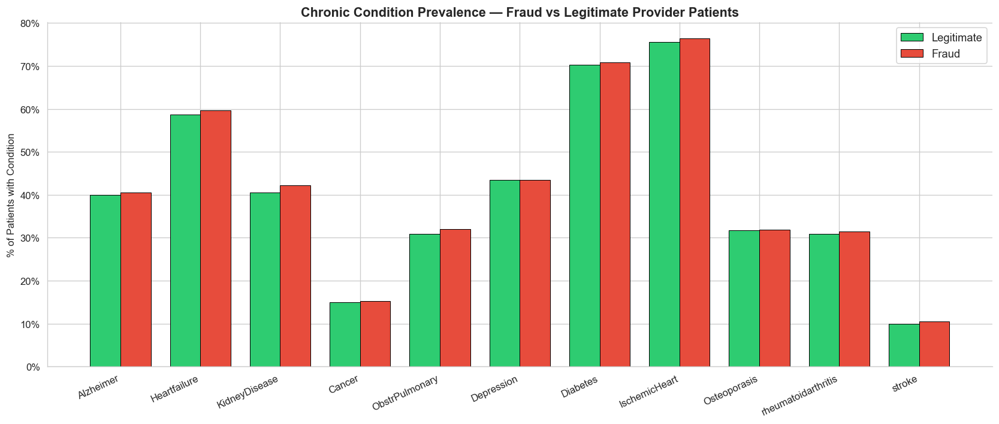

In [18]:
chronic_in_claims = [c for c in chronic_cols if c in df_claims.columns]
fraud_chronic = df_claims[df_claims['PotentialFraud']==1][chronic_in_claims].mean() * 100
legit_chronic = df_claims[df_claims['PotentialFraud']==0][chronic_in_claims].mean() * 100
cond_names    = [c.replace('ChronicCond_', '') for c in chronic_in_claims]

x = np.arange(len(cond_names))
width = 0.38

fig, ax = plt.subplots(figsize=(14, 6))
ax.bar(x - width/2, legit_chronic.values, width, label='Legitimate',
       color=C_LEGIT, edgecolor='black', linewidth=0.6)
ax.bar(x + width/2, fraud_chronic.values,  width, label='Fraud',
       color=C_FRAUD,  edgecolor='black', linewidth=0.6)
ax.set_xticks(x)
ax.set_xticklabels(cond_names, rotation=25, ha='right', fontsize=10)
ax.set_ylabel('% of Patients with Condition')
ax.set_title('Chronic Condition Prevalence — Fraud vs Legitimate Provider Patients',
             fontweight='bold', fontsize=13)
ax.legend(fontsize=11)
ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda v, _: f'{v:.0f}%'))
plt.tight_layout()
plt.show()

### Inpatient Hospital Stay Analysis

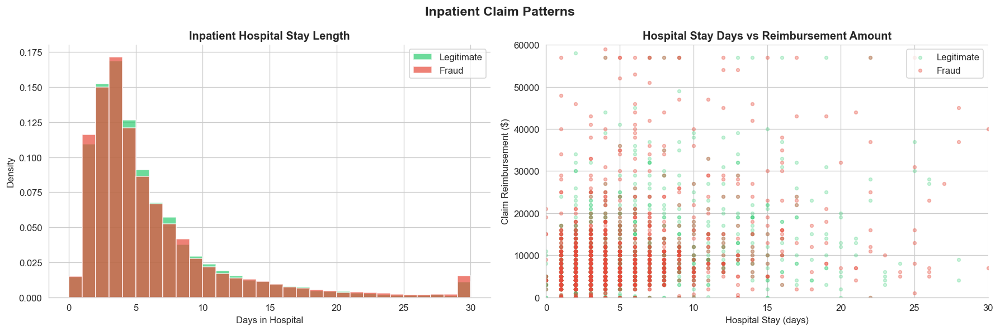

In [19]:
ip_fraud = df_claims[(df_claims['ClaimType']=='Inpatient') & (df_claims['PotentialFraud']==1)]
ip_legit = df_claims[(df_claims['ClaimType']=='Inpatient') & (df_claims['PotentialFraud']==0)]

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

ax = axes[0]
ax.hist(ip_legit['HospitalStayDays'].dropna().clip(upper=30), bins=30,
        alpha=0.7, color=C_LEGIT, label='Legitimate', density=True)
ax.hist(ip_fraud['HospitalStayDays'].dropna().clip(upper=30), bins=30,
        alpha=0.7, color=C_FRAUD,  label='Fraud',      density=True)
ax.set_title('Inpatient Hospital Stay Length', fontweight='bold')
ax.set_xlabel('Days in Hospital')
ax.set_ylabel('Density')
ax.legend()

ax = axes[1]
s_l = ip_legit.sample(min(1500, len(ip_legit)), random_state=42)
s_f = ip_fraud.sample(min(1500, len(ip_fraud)),  random_state=42)
ax.scatter(s_l['HospitalStayDays'], s_l['InscClaimAmtReimbursed'],
           alpha=0.25, color=C_LEGIT, s=12, label='Legitimate')
ax.scatter(s_f['HospitalStayDays'], s_f['InscClaimAmtReimbursed'],
           alpha=0.35, color=C_FRAUD,  s=12, label='Fraud')
ax.set_title('Hospital Stay Days vs Reimbursement Amount', fontweight='bold')
ax.set_xlabel('Hospital Stay (days)')
ax.set_ylabel('Claim Reimbursement ($)')
ax.set_ylim(0, 60000)
ax.set_xlim(0, 30)
ax.legend()

plt.suptitle('Inpatient Claim Patterns', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [20]:
provider_df = pd.read_csv('./cleaned_data/provider_features.csv')
claims_df = pd.read_csv('./cleaned_data/claims_cleaned.csv')
bene_df = pd.read_csv('./cleaned_data/beneficiary_cleaned.csv')

df_master = claims_df.merge(provider_df[['Provider', 'PotentialFraud']], on='Provider', how='left')
bene_df['Age'] = 2024 - pd.to_datetime(bene_df['DOB']).dt.year
df_master = df_master.merge(bene_df[['BeneID', 'Age', 'Gender']], on='BeneID', how='left')

colors = {'Yes': '#E74C3C', 'No': '#2E4053'} 

### Market Integrity: Analyzing the Fraudulent-to-Legitimate Provider Ratio

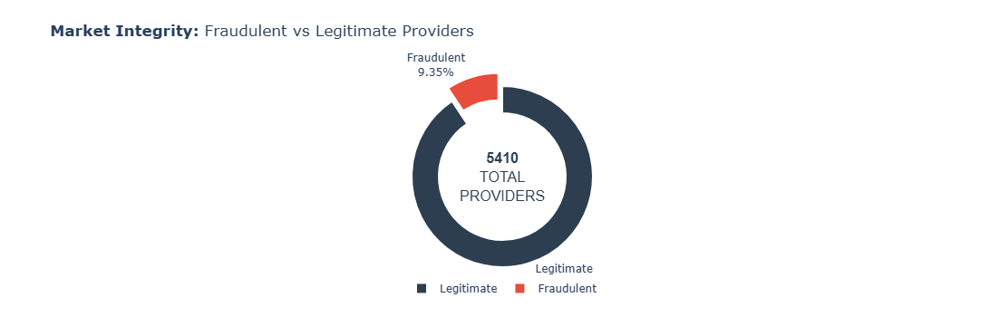

In [21]:
fraud_col = 'PotentialFraud' if 'PotentialFraud' in provider_df.columns else 'PotentialFraud_x'
fraud_counts = provider_df[fraud_col].value_counts().reset_index()
fraud_counts.columns = ['Status', 'Count']
fraud_counts['Status'] = fraud_counts['Status'].map({0: 'Legitimate', 1: 'Fraudulent', 
                                                   '0': 'Legitimate', '1': 'Fraudulent',
                                                   'No': 'Legitimate', 'Yes': 'Fraudulent'})

fig1 = px.pie(fraud_counts, 
             values='Count', 
             names='Status', 
             hole=0.7, 
             color='Status',
             color_discrete_map={'Legitimate': '#2C3E50', 'Fraudulent': '#E74C3C'},
             title="<b>Market Integrity:</b> Fraudulent vs Legitimate Providers")

fig1.update_traces(
    textposition='outside', 
    textinfo='percent+label',
    pull=[0, 0.15], 
    marker=dict(line=dict(color='#FFFFFF', width=2)), 
    hovertemplate="<b>%{label}</b><br>Total: %{value}<br>Ratio: %{percent}<extra></extra>"
)

fig1.add_annotation(
    text=f"<b>{len(provider_df)}</b><br>TOTAL<br>PROVIDERS",
    showarrow=False,
    font=dict(size=16, family="Arial", color="#2C3E50"),
    x=0.5, y=0.5
)

fig1.update_layout(
    template="plotly_white",
    showlegend=True,
    legend=dict(orientation="h", yanchor="bottom", y=-0.1, xanchor="center", x=0.5),
    margin=dict(t=80, b=50, l=50, r=50)
)

fig1.show()

In [22]:
if 'PotentialFraud_x' in df_master.columns:
    df_master = df_master.rename(columns={'PotentialFraud_x': 'PotentialFraud', 'Age_x': 'Age', 'Gender_x': 'Gender'})

df_master = df_master.loc[:,~df_master.columns.duplicated()]

print(df_master.columns.tolist())

['BeneID', 'ClaimID', 'ClaimStartDt', 'ClaimEndDt', 'Provider', 'InscClaimAmtReimbursed', 'AttendingPhysician', 'OperatingPhysician', 'OtherPhysician', 'AdmissionDt', 'ClmAdmitDiagnosisCode', 'DeductibleAmtPaid', 'DischargeDt', 'DiagnosisGroupCode', 'ClmDiagnosisCode_1', 'ClmDiagnosisCode_2', 'ClmDiagnosisCode_3', 'ClmDiagnosisCode_4', 'ClmDiagnosisCode_5', 'ClmDiagnosisCode_6', 'ClmDiagnosisCode_7', 'ClmDiagnosisCode_8', 'ClmDiagnosisCode_9', 'ClmDiagnosisCode_10', 'ClmProcedureCode_1', 'ClaimDays', 'HospitalStayDays', 'DiagnosisCount', 'ProcedureCount', 'ClaimType', 'DOB', 'DOD', 'Gender', 'Race', 'RenalDiseaseIndicator', 'State', 'County', 'NoOfMonths_PartACov', 'NoOfMonths_PartBCov', 'ChronicCond_Alzheimer', 'ChronicCond_Heartfailure', 'ChronicCond_KidneyDisease', 'ChronicCond_Cancer', 'ChronicCond_ObstrPulmonary', 'ChronicCond_Depression', 'ChronicCond_Diabetes', 'ChronicCond_IschemicHeart', 'ChronicCond_Osteoporasis', 'ChronicCond_rheumatoidarthritis', 'ChronicCond_stroke', 'IPAn

### Fraud Anatomy: Visualizing Hierarchical Financial Exposure by State

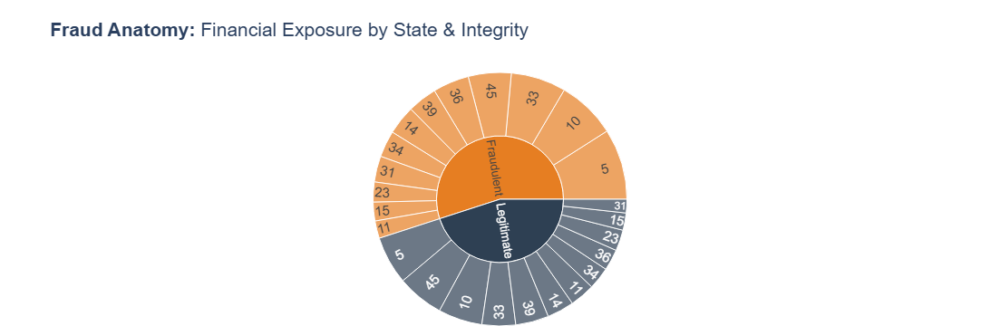

In [23]:
fraud_col = 'PotentialFraud' if 'PotentialFraud' in df_master.columns else 'PotentialFraud_x'
reimb_col = 'InscClaimAmtReimbursed'

df_viz2 = df_master.copy()
df_viz2[fraud_col] = df_viz2[fraud_col].map({0: 'Legitimate', 1: 'Fraudulent', 
                                            '0': 'Legitimate', '1': 'Fraudulent',
                                            'No': 'Legitimate', 'Yes': 'Fraudulent'})

top_states = df_viz2.groupby('State')[reimb_col].sum().nlargest(12).index
df_filtered = df_viz2[df_viz2['State'].isin(top_states)]

fig2 = px.sunburst(df_filtered, 
                  path=[fraud_col, 'State'], 
                  values=reimb_col,
                  color=fraud_col, 
                  color_discrete_map={'Legitimate': '#2E4053', 'Fraudulent': '#E67E22'}, # Slate и Amber
                  title="<b>Fraud Anatomy:</b> Financial Exposure by State & Integrity")

fig2.update_traces(
    branchvalues="total",
    hovertemplate='<b>%{label}</b><br>Total Reimbursed: $%{value:,.0f}<br>Contribution: %{percentParent:.1%}',
    insidetextorientation='radial' 
)

fig2.update_layout(
    template="plotly_white",
    margin=dict(t=80, l=0, r=0, b=0),
    font=dict(family="Arial", size=15)
)

fig2.show()

###  Strategic Risk Distribution: Identifying Major Financial Loss Centers

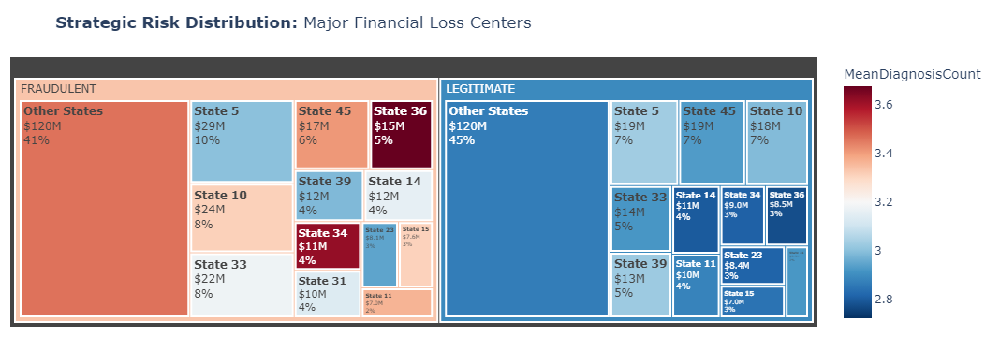

In [24]:
fraud_col = 'PotentialFraud' if 'PotentialFraud' in provider_df.columns else 'PotentialFraud_x'
reimb_col = 'InscClaimAmtReimbursed'

df_for_tree = claims_df[['Provider', 'State', reimb_col]].merge(
    provider_df[['Provider', fraud_col, 'MeanDiagnosisCount']], 
    on='Provider', 
    how='left'
)

df_tree = df_for_tree.groupby([fraud_col, 'State']).agg({
    reimb_col: 'sum',
    'MeanDiagnosisCount': 'mean'
}).reset_index()

top_states = df_tree.groupby('State')[reimb_col].sum().nlargest(12).index
df_tree['State_Grouped'] = df_tree['State'].apply(lambda x: f"State {int(x)}" if x in top_states else "Other States")

df_tree_clean = df_tree.groupby([fraud_col, 'State_Grouped']).agg({
    reimb_col: 'sum',
    'MeanDiagnosisCount': 'mean'
}).reset_index()

df_tree_clean[fraud_col] = df_tree_clean[fraud_col].map({1: 'FRAUDULENT', 0: 'LEGITIMATE', '1': 'FRAUDULENT', '0': 'LEGITIMATE', 'Yes': 'FRAUDULENT', 'No': 'LEGITIMATE'})

fig3 = px.treemap(df_tree_clean, 
                 path=[fraud_col, 'State_Grouped'], 
                 values=reimb_col,
                 color='MeanDiagnosisCount',
                 color_continuous_scale='RdBu_r', 
                 color_continuous_midpoint=3.2,
                 title="<b> Strategic Risk Distribution:</b> Major Financial Loss Centers")

fig3.update_traces(
    textinfo="label+value+percent parent",
    texttemplate="<b>%{label}</b><br>$%{value:,.2s}<br>%{percentParent:.0%}",
    hovertemplate="<b>%{label}</b><br>Total: $%{value:,.0f}<br>Complexity: %{color:.2f}",
    marker=dict(line=dict(width=2, color='white')),
)

fig3.update_layout(template="plotly_white", margin=dict(t=60, l=10, r=10, b=10))
fig3.show()

### Feature Interdependence: Mapping Key Predictors of Potential Fraud

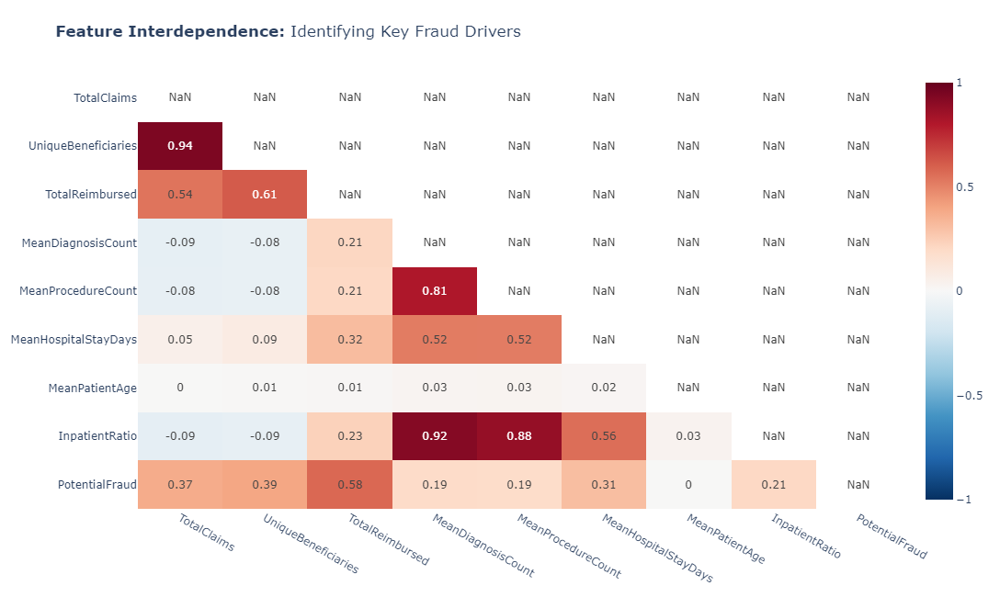

In [25]:
cols_to_corr = ['TotalClaims', 'UniqueBeneficiaries', 'TotalReimbursed', 'MeanDiagnosisCount', 
                'MeanProcedureCount', 'MeanHospitalStayDays', 'MeanPatientAge', 'InpatientRatio', 'PotentialFraud']

df_corr = provider_df[cols_to_corr].copy()
df_corr['PotentialFraud'] = df_corr['PotentialFraud'].map({'Yes': 1, 'No': 0, 1: 1, 0: 0})
corr_matrix = df_corr.corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
df_mask = corr_matrix.mask(mask)

fig4 = go.Figure(data=go.Heatmap(
    z=df_mask.values,
    x=df_mask.columns,
    y=df_mask.index,
    colorscale='RdBu_r',
    zmin=-1, zmax=1,
    hoverinfo='z',
    text=df_mask.values.round(2), 
    texttemplate="%{text}",
    showscale=True
))

fig4.update_layout(
    title="<b> Feature Interdependence:</b> Identifying Key Fraud Drivers",
    template="plotly_white",
    height=650,
    xaxis_showgrid=False,
    yaxis_showgrid=False,
    yaxis_autorange='reversed', 
    margin=dict(t=80, b=50, l=150, r=50)
)

fig4.show()

### Financial Footprint: Detecting High-Value Anomalies and Outliers

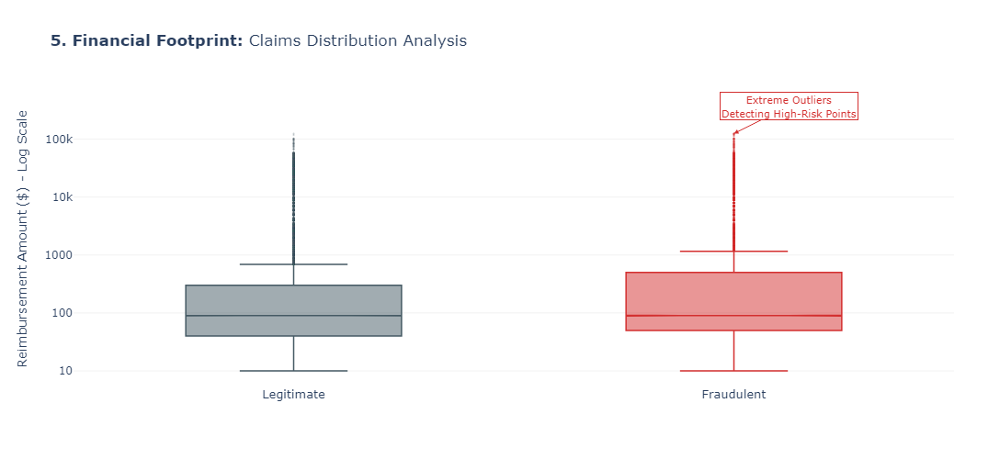

In [26]:
fraud_col = 'PotentialFraud' if 'PotentialFraud' in df_master.columns else 'PotentialFraud_x'
reimb_col = 'InscClaimAmtReimbursed'

df_box = df_master[df_master[reimb_col] > 0].copy()
df_box[fraud_col] = df_box[fraud_col].map({1: 'Fraudulent', 0: 'Legitimate', '1': 'Fraudulent', '0': 'Legitimate', 'Yes': 'Fraudulent', 'No': 'Legitimate'})

fig5 = px.box(df_box, 
             y=reimb_col, x=fraud_col, color=fraud_col,
             points="outliers", notched=True, log_y=True,
             color_discrete_map={'Fraudulent': '#D32F2F', 'Legitimate': '#455A64'},
             title="<b>5. Financial Footprint:</b> Claims Distribution Analysis",
             category_orders={fraud_col: ["Legitimate", "Fraudulent"]})

fig5.update_traces(
    hoverinfo="y",           
    hoveron="boxes+points",  
    hovertemplate="<b>%{x}</b><br>Amount: $%{y:,.0f}<extra></extra>",
    marker=dict(size=2, opacity=0.3),
    line_width=1.5
)

fig5.update_layout(
    template="plotly_white",
    hovermode='closest',     
    showlegend=False,
    yaxis=dict(
        title="Reimbursement Amount ($) - Log Scale", 
        gridcolor='#F2F2F2', 
        zeroline=False,
        dtick=1 
    ),
    xaxis=dict(title="", tickfont=dict(size=13)),
    height=500,
    margin=dict(r=50) 
)

max_fraud = df_box[df_box[fraud_col]=='Fraudulent'][reimb_col].max()
fig5.add_annotation(
    x="Fraudulent", y=np.log10(max_fraud),
    text="Extreme Outliers<br>Detecting High-Risk Points",
    showarrow=True, arrowhead=2, arrowcolor="#D32F2F",
    ax=60, ay=-30, font=dict(color="#D32F2F", size=11),
    bgcolor="white", bordercolor="#D32F2F", borderwidth=1
)

fig5.show()

###  National Risk Heatmap: Geospatial Distribution of Financial Losses

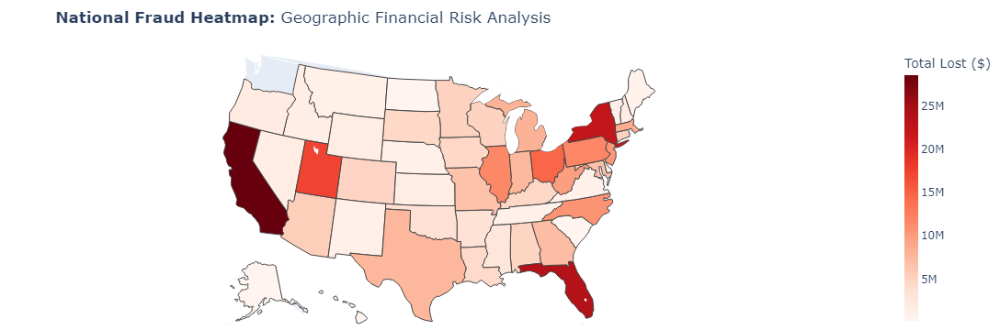

In [27]:
import plotly.express as px

state_map = {
    1: 'AL', 2: 'AK', 3: 'AZ', 4: 'AR', 5: 'CA', 6: 'CO', 7: 'CT', 8: 'DE', 9: 'DC', 10: 'FL',
    11: 'GA', 12: 'HI', 13: 'ID', 14: 'IL', 15: 'IN', 16: 'IA', 17: 'KS', 18: 'KY', 19: 'LA', 20: 'ME',
    21: 'MD', 22: 'MA', 23: 'MI', 24: 'MN', 25: 'MS', 26: 'MO', 27: 'MT', 28: 'NE', 29: 'NV', 30: 'NH',
    31: 'NJ', 32: 'NM', 33: 'NY', 34: 'NC', 35: 'ND', 36: 'OH', 37: 'OK', 38: 'OR', 39: 'PA', 40: 'RI',
    41: 'SC', 42: 'SD', 43: 'TN', 44: 'TX', 45: 'UT', 46: 'VT', 47: 'VA', 48: 'WA', 49: 'WV', 50: 'WI', 51: 'WY'
}

state_fraud = df_master[df_master[fraud_col].isin(['Yes', 1, 'Fraudulent'])].groupby('State').agg({
    'Provider': 'nunique', 
    reimb_col: 'sum'
}).reset_index()

state_fraud['State_Alpha'] = state_fraud['State'].map(state_map)

fig7 = px.choropleth(state_fraud,
                    locations='State_Alpha', 
                    locationmode="USA-states", 
                    color=reimb_col,
                    scope="usa",
                    hover_name='State_Alpha',
                    hover_data={'State_Alpha': False, reimb_col: ':$.2f', 'Provider': True},
                    color_continuous_scale="Reds",
                    title="<b> National Fraud Heatmap:</b> Geographic Financial Risk Analysis")

fig7.update_layout(
    geo=dict(bgcolor='rgba(0,0,0,0)', lakecolor='rgb(255, 255, 255)'),
    margin=dict(l=0, r=0, t=50, b=0),
    coloraxis_colorbar=dict(title="Total Lost ($)", thicknessmode="pixels", thickness=15)
)
fig7.show()

### The Complexity Trap: Evidence of Artificial Medical Record Inflation

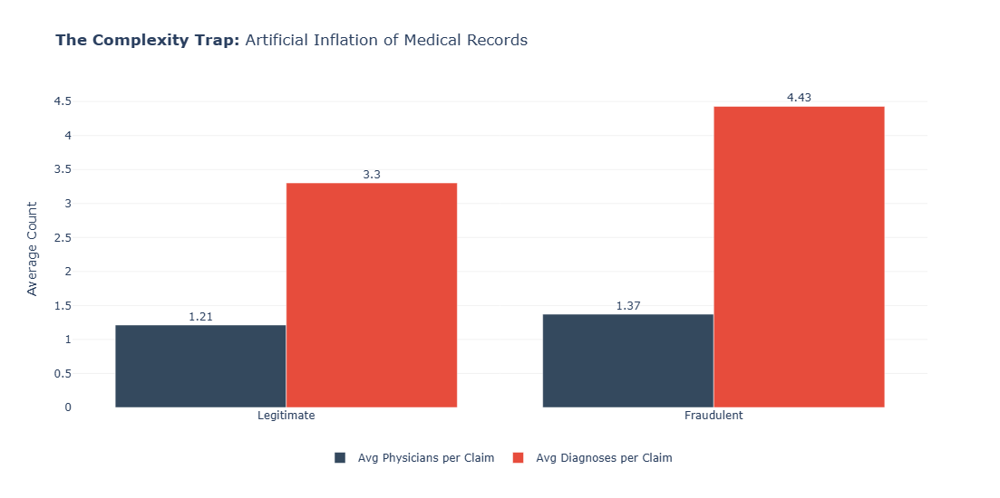

In [28]:
fraud_col = 'PotentialFraud' if 'PotentialFraud' in provider_df.columns else 'PotentialFraud_x'

complexity_df = provider_df.groupby(fraud_col).agg({
    'MeanUniquePhysPerClaim': 'mean',
    'MeanDiagnosisCount': 'mean'
}).reset_index()

complexity_df[fraud_col] = complexity_df[fraud_col].map({
    1: 'Fraudulent', 0: 'Legitimate', 'Yes': 'Fraudulent', 'No': 'Legitimate',
    'Fraudulent': 'Fraudulent', 'Legitimate': 'Legitimate'
})

fig8 = go.Figure()

fig8.add_trace(go.Bar(
    x=complexity_df[fraud_col],
    y=complexity_df['MeanUniquePhysPerClaim'],
    name='Avg Physicians per Claim',
    marker_color='#34495E', 
    text=complexity_df['MeanUniquePhysPerClaim'].round(2),
    textposition='outside'
))

fig8.add_trace(go.Bar(
    x=complexity_df[fraud_col],
    y=complexity_df['MeanDiagnosisCount'],
    name='Avg Diagnoses per Claim',
    marker_color='#E74C3C', 
    text=complexity_df['MeanDiagnosisCount'].round(2),
    textposition='outside'
))

fig8.update_layout(
    title="<b> The Complexity Trap:</b> Artificial Inflation of Medical Records",
    barmode='group',
    template="plotly_white",
    yaxis_title="Average Count",
    xaxis_title="",
    legend=dict(orientation="h", yanchor="bottom", y=-0.2, xanchor="center", x=0.5),
    height=550,
    margin=dict(t=100, b=100)
)
fig8.update_yaxes(showgrid=True, gridcolor='#F2F2F2', zeroline=False)
fig8.show()

# Machine Learning Experiments

In [29]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, precision_recall_curve,
    average_precision_score, f1_score, recall_score, precision_score
)
from sklearn.model_selection import RandomizedSearchCV

from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTETomek

from xgboost import XGBClassifier
import lightgbm as lgb
from scipy.stats import randint, uniform

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', 50)
RANDOM_STATE = 42

In [30]:
provider_agg = pd.read_csv('./cleaned_data/provider_features.csv')
df_claims    = pd.read_csv('./cleaned_data/claims_cleaned.csv')

---
## Machine Learning Experience

In [31]:
!pip install lightgbm imbalanced-learn xgboost --quiet

In [32]:
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, precision_recall_curve,
    average_precision_score, f1_score, recall_score, precision_score
)
from sklearn.model_selection import RandomizedSearchCV

from imblearn.over_sampling import SMOTE, ADASYN
from imblearn.combine import SMOTETomek

from xgboost import XGBClassifier
import lightgbm as lgb
from scipy.stats import randint, uniform

In [33]:
provider_agg = pd.read_csv('./cleaned_data/provider_features.csv')

df_claims = pd.read_csv('./cleaned_data/claims_cleaned.csv')

---
## Step 1 — Feature Engineering

In [34]:
def build_enhanced_features(claims_df, provider_agg_df):
    print('Building enhanced features...')

    reimb_skew = (
        claims_df.groupby('Provider')['InscClaimAmtReimbursed']
        .skew()
        .rename('ReimbursementSkewness')
    )

    reimb_p90 = (
        claims_df.groupby('Provider')['InscClaimAmtReimbursed']
        .quantile(0.90)
        .rename('ReimbursedP90')
    )

    phys_bene = (
        claims_df.groupby('Provider')
        .apply(lambda g: g['AttendingPhysician'].nunique() / max(g['BeneID'].nunique(), 1))
        .rename('PhysicianToBeneficiaryRatio')
    )

    def herfindahl(x):
        counts = x.value_counts(normalize=True)
        return (counts ** 2).sum()

    phys_hhi = (
        claims_df.groupby('Provider')['AttendingPhysician']
        .apply(herfindahl)
        .rename('PhysicianConcentrationHHI')
    )

    if 'ClaimStartDt' in claims_df.columns:
        claims_df['ClaimStartDt'] = pd.to_datetime(claims_df['ClaimStartDt'], errors='coerce')
        velocity = (
            claims_df.groupby('Provider')
            .apply(lambda g: len(g) / max(g['ClaimStartDt'].nunique(), 1))
            .rename('ClaimVelocity')
        )
    else:
        velocity = pd.Series(dtype=float, name='ClaimVelocity')

    diag_cols = [c for c in claims_df.columns if c.startswith('ClmDiagnosisCode_')]
    if diag_cols:
        def unique_diag_count(g):
            all_codes = g[diag_cols].values.flatten()
            return pd.Series(all_codes).dropna().nunique()

        unique_diag = (
            claims_df.groupby('Provider')
            .apply(unique_diag_count)
            .rename('UniqueDiagnosisCodes')
        )
    else:
        unique_diag = pd.Series(dtype=float, name='UniqueDiagnosisCodes')

    if 'ClaimDays' in claims_df.columns:
        claims_df['ReimbursedPerDay'] = (
            claims_df['InscClaimAmtReimbursed'] /
            claims_df['ClaimDays'].replace(0, np.nan)
        )
        reimb_per_day = (
            claims_df.groupby('Provider')['ReimbursedPerDay']
            .mean()
            .rename('MeanReimbursedPerClaimDay')
        )
    else:
        reimb_per_day = pd.Series(dtype=float, name='MeanReimbursedPerClaimDay')

    if 'ClaimType' in claims_df.columns:
        ip_mean = (
            claims_df[claims_df['ClaimType'] == 'Inpatient']
            .groupby('Provider')['InscClaimAmtReimbursed'].mean()
            .rename('InpatientMeanReimbursed')
        )
        op_mean = (
            claims_df[claims_df['ClaimType'] == 'Outpatient']
            .groupby('Provider')['InscClaimAmtReimbursed'].mean()
            .rename('OutpatientMeanReimbursed')
        )
        ip_premium = (ip_mean / op_mean.replace(0, np.nan)).rename('InpatientReimbursementPremium')
    else:
        ip_premium = pd.Series(dtype=float, name='InpatientReimbursementPremium')

    new_features = [
        reimb_skew, reimb_p90, phys_bene, phys_hhi,
        velocity, unique_diag, reimb_per_day, ip_premium
    ]

    result = provider_agg_df.copy()
    for feat in new_features:
        if len(feat) > 0:
            result = result.merge(
                feat.reset_index(),
                on='Provider',
                how='left'
            )

    result.fillna(0, inplace=True)
    new_cols = [f.name for f in new_features if len(f) > 0]
    print(f'  Added {len(new_cols)} new features: {new_cols}')
    print(f'  Final shape: {result.shape}')
    return result, new_cols


provider_enhanced, new_feature_names = build_enhanced_features(df_claims, provider_agg)

Building enhanced features...
  Added 8 new features: ['ReimbursementSkewness', 'ReimbursedP90', 'PhysicianToBeneficiaryRatio', 'PhysicianConcentrationHHI', 'ClaimVelocity', 'UniqueDiagnosisCodes', 'MeanReimbursedPerClaimDay', 'InpatientReimbursementPremium']
  Final shape: (5410, 32)


In [35]:
original_features = [
    'TotalClaims', 'UniqueBeneficiaries', 'UniquePhysicians',
    'TotalReimbursed', 'MeanReimbursed', 'MaxReimbursed',
    'ClaimsPerBeneficiary', 'InpatientRatio', 'ReimbursementCV',
    'ReimbursedPerBeneficiary', 'MeanDiagnosisCount', 'MeanProcedureCount',
    'MeanHospitalStayDays', 'MeanPatientAge', 'PctDeceasedPatients', 'MeanChronicConds'
]

all_features = original_features + [f for f in new_feature_names if f in provider_enhanced.columns]
print(f'Total features: {len(all_features)} (was 16, now {len(all_features)})')

TARGET = 'PotentialFraud'
X = provider_enhanced[all_features]
y = provider_enhanced[TARGET].map({'Yes': 1, 'No': 0, 1: 1, 0: 0})

print(f'\nFraud rate: {y.mean():.1%}')
print(f'Positive class: {y.sum()} | Negative class: {(y==0).sum()}')

Total features: 24 (was 16, now 24)

Fraud rate: 9.4%
Positive class: 506 | Negative class: 4904


---
## Step 2 — Train/Test Split + Resampling Strategy


In [36]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, stratify=y, random_state=RANDOM_STATE
)

print(f'Train: {X_train.shape[0]:,} | Test: {X_test.shape[0]:,}')
print(f'Train fraud: {y_train.mean():.1%} | Test fraud: {y_test.mean():.1%}')

smote_tomek = SMOTETomek(random_state=RANDOM_STATE)
X_train_res, y_train_res = smote_tomek.fit_resample(X_train, y_train)

print(f'\nAfter SMOTETomek: {X_train_res.shape[0]:,} rows | fraud: {y_train_res.mean():.1%}')

smote = SMOTE(random_state=RANDOM_STATE, k_neighbors=5)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)
print(f'After SMOTE:      {X_train_smote.shape[0]:,} rows | fraud: {y_train_smote.mean():.1%}')

Train: 4,328 | Test: 1,082
Train fraud: 9.4% | Test fraud: 9.3%

After SMOTETomek: 7,644 rows | fraud: 50.0%
After SMOTE:      7,846 rows | fraud: 50.0%


---
## Step 3 — Optimal Threshold Search


In [37]:
def find_optimal_threshold(y_true, y_proba, metric='f1', plot=True, model_name='Model'):

    precisions, recalls, thresholds = precision_recall_curve(y_true, y_proba)

    f1_scores = np.where(
        (precisions[:-1] + recalls[:-1]) == 0, 0,
        2 * precisions[:-1] * recalls[:-1] / (precisions[:-1] + recalls[:-1])
    )

    best_idx = f1_scores.argmax()
    best_threshold = thresholds[best_idx]
    best_f1        = f1_scores[best_idx]
    best_precision = precisions[best_idx]
    best_recall    = recalls[best_idx]

    y_pred_default = (y_proba >= 0.5).astype(int)
    default_f1     = f1_score(y_true, y_pred_default)

    print(f'\n{model_name}')
    print(f'  Default threshold (0.50): F1 = {default_f1:.4f}')
    print(f'  Optimal threshold ({best_threshold:.2f}): F1 = {best_f1:.4f}  '
          f'[Precision={best_precision:.3f}, Recall={best_recall:.3f}]')
    print(f'  F1 improvement: +{best_f1 - default_f1:.4f}')

    if plot:
        fig, axes = plt.subplots(1, 2, figsize=(14, 4))

        axes[0].plot(thresholds, f1_scores, color=C_BLUE, lw=2, label='F1 score')
        axes[0].plot(thresholds, precisions[:-1], color=C_ORANGE, lw=1.5, linestyle='--', label='Precision')
        axes[0].plot(thresholds, recalls[:-1], color=C_LEGIT, lw=1.5, linestyle='--', label='Recall')
        axes[0].axvline(best_threshold, color=C_FRAUD, lw=2, label=f'Optimal = {best_threshold:.2f}')
        axes[0].axvline(0.5, color='gray', lw=1.5, linestyle=':', label='Default = 0.50')
        axes[0].set_xlabel('Threshold')
        axes[0].set_title(f'{model_name} — Threshold vs Metrics', fontweight='bold')
        axes[0].legend(fontsize=8)
        axes[0].set_xlim(0, 1)

        axes[1].plot(recalls, precisions, color=C_BLUE, lw=2)
        axes[1].scatter(best_recall, best_precision, color=C_FRAUD, s=100, zorder=5,
                        label=f'Optimal point (F1={best_f1:.3f})')
        axes[1].set_xlabel('Recall')
        axes[1].set_ylabel('Precision')
        axes[1].set_title(f'{model_name} — Precision-Recall Curve', fontweight='bold')
        axes[1].legend()

        plt.tight_layout()
        plt.show()

    return best_threshold, best_f1, best_precision, best_recall


print('Threshold optimization function defined.')

Threshold optimization function defined.


---
## Step 4 — Retune Models Scoring on F1 (not AUC)


=== Random Forest (F1-tuned) ===
Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best CV F1: 0.9569

Random Forest
  Default threshold (0.50): F1 = 0.6178
  Optimal threshold (0.54): F1 = 0.6367  [Precision=0.542, Recall=0.772]
  F1 improvement: +0.0190


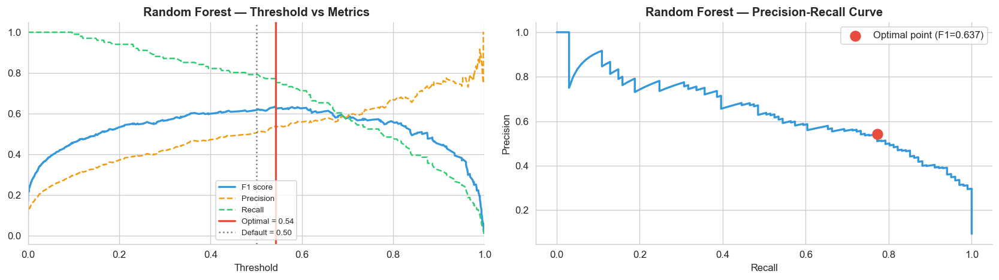

In [38]:
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=RANDOM_STATE)

print('=== Random Forest (F1-tuned) ===')

rf_params = {
    'n_estimators'      : randint(200, 600),
    'max_depth'         : [5, 8, 10, 15, 20, None],
    'min_samples_split' : randint(2, 15),
    'min_samples_leaf'  : randint(1, 8),
    'max_features'      : ['sqrt', 'log2', 0.4, 0.6],
    'class_weight'      : ['balanced', 'balanced_subsample'],
}

rf_search = RandomizedSearchCV(
    RandomForestClassifier(random_state=RANDOM_STATE, n_jobs=-1),
    param_distributions=rf_params,
    n_iter=40,
    scoring='f1',          
    cv=cv,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=1
)
rf_search.fit(X_train_res, y_train_res)

rf_best = rf_search.best_estimator_
y_proba_rf = rf_best.predict_proba(X_test)[:, 1]

print(f'Best CV F1: {rf_search.best_score_:.4f}')
rf_thresh, rf_f1_opt, rf_prec_opt, rf_rec_opt = find_optimal_threshold(
    y_test, y_proba_rf, model_name='Random Forest'
)
y_pred_rf_opt = (y_proba_rf >= rf_thresh).astype(int)

=== XGBoost (F1-tuned, enhanced features) ===
scale_pos_weight = 9.69
Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best CV F1: 0.9612

XGBoost
  Default threshold (0.50): F1 = 0.6429
  Optimal threshold (0.40): F1 = 0.6538  [Precision=0.535, Recall=0.842]
  F1 improvement: +0.0110


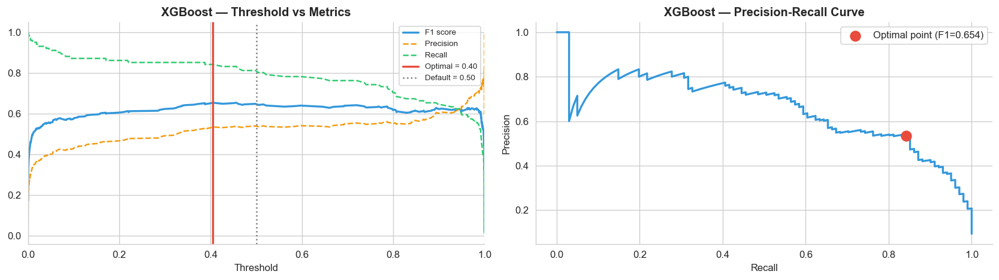

In [39]:
print('=== XGBoost (F1-tuned, enhanced features) ===')

neg_count = (y_train == 0).sum()
pos_count = (y_train == 1).sum()
scale_pos_weight = neg_count / pos_count
print(f'scale_pos_weight = {scale_pos_weight:.2f}')

xgb_params = {
    'n_estimators'     : randint(200, 700),
    'max_depth'        : randint(3, 8),
    'learning_rate'    : uniform(0.01, 0.2),
    'subsample'        : uniform(0.6, 0.4),
    'colsample_bytree' : uniform(0.5, 0.5),
    'min_child_weight' : randint(1, 8),
    'gamma'            : uniform(0, 0.3),
    'reg_alpha'        : uniform(0, 0.5),
    'reg_lambda'       : uniform(1.0, 1.0),
}

xgb_search = RandomizedSearchCV(
    XGBClassifier(
        scale_pos_weight=scale_pos_weight,
        eval_metric='logloss',
        random_state=RANDOM_STATE,
        n_jobs=-1,
        verbosity=0
    ),
    param_distributions=xgb_params,
    n_iter=40,
    scoring='f1',         
    cv=cv,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=1
)
xgb_search.fit(X_train_res, y_train_res)

xgb_best = xgb_search.best_estimator_
y_proba_xgb = xgb_best.predict_proba(X_test)[:, 1]

print(f'Best CV F1: {xgb_search.best_score_:.4f}')
xgb_thresh, xgb_f1_opt, xgb_prec_opt, xgb_rec_opt = find_optimal_threshold(
    y_test, y_proba_xgb, model_name='XGBoost'
)
y_pred_xgb_opt = (y_proba_xgb >= xgb_thresh).astype(int)

=== LightGBM (F1-tuned, enhanced features) ===
Fitting 5 folds for each of 40 candidates, totalling 200 fits
Best CV F1: 0.9682

LightGBM
  Default threshold (0.50): F1 = 0.6460
  Optimal threshold (0.60): F1 = 0.6575  [Precision=0.610, Recall=0.713]
  F1 improvement: +0.0115


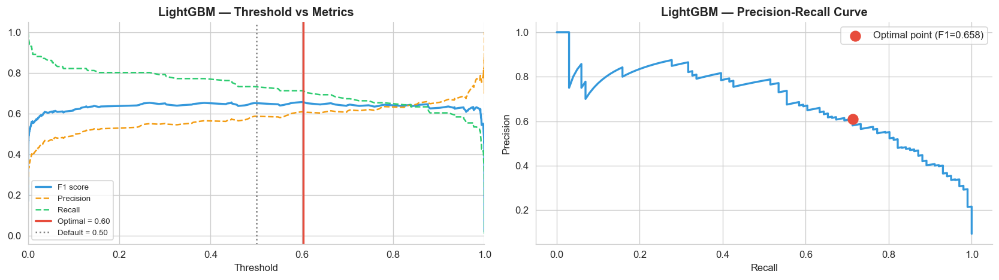

In [40]:
print('=== LightGBM (F1-tuned, enhanced features) ===')

lgb_params = {
    'n_estimators'      : randint(200, 700),
    'max_depth'         : randint(3, 10),
    'learning_rate'     : uniform(0.01, 0.2),
    'num_leaves'        : randint(20, 100),
    'subsample'         : uniform(0.6, 0.4),
    'colsample_bytree'  : uniform(0.5, 0.5),
    'min_child_samples' : randint(5, 30),
    'reg_alpha'         : uniform(0, 0.5),
    'reg_lambda'        : uniform(0, 0.5),
    'class_weight'      : ['balanced', None],
}

lgb_search = RandomizedSearchCV(
    lgb.LGBMClassifier(random_state=RANDOM_STATE, n_jobs=-1, verbose=-1),
    param_distributions=lgb_params,
    n_iter=40,
    scoring='f1',      
    cv=cv,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=1
)
lgb_search.fit(X_train_res, y_train_res)

lgb_best = lgb_search.best_estimator_
y_proba_lgb = lgb_best.predict_proba(X_test)[:, 1]

print(f'Best CV F1: {lgb_search.best_score_:.4f}')
lgb_thresh, lgb_f1_opt, lgb_prec_opt, lgb_rec_opt = find_optimal_threshold(
    y_test, y_proba_lgb, model_name='LightGBM'
)
y_pred_lgb_opt = (y_proba_lgb >= lgb_thresh).astype(int)

=== Logistic Regression (F1-tuned) ===
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Best CV F1: 0.8791

Logistic Regression
  Default threshold (0.50): F1 = 0.5857
  Optimal threshold (0.86): F1 = 0.7100  [Precision=0.717, Recall=0.703]
  F1 improvement: +0.1243


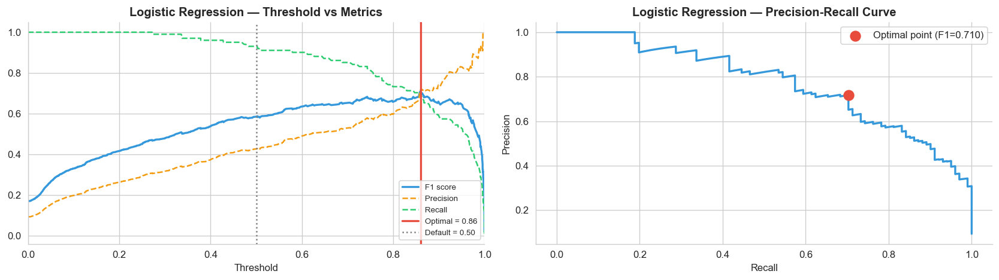

In [41]:
print('=== Logistic Regression (F1-tuned) ===')

lr_params = {
    'clf__C'        : uniform(0.001, 10),
    'clf__penalty'  : ['l1', 'l2', 'elasticnet'],
    'clf__solver'   : ['saga'],
    'clf__l1_ratio' : uniform(0, 1),
}

lr_search = RandomizedSearchCV(
    Pipeline([
        ('scaler', RobustScaler()),   
        ('clf',    LogisticRegression(
            class_weight='balanced',
            max_iter=3000,
            random_state=RANDOM_STATE
        ))
    ]),
    param_distributions=lr_params,
    n_iter=30,
    scoring='f1',       
    cv=cv,
    random_state=RANDOM_STATE,
    n_jobs=-1,
    verbose=1
)
lr_search.fit(X_train_smote, y_train_smote)  

lr_best = lr_search.best_estimator_
y_proba_lr = lr_best.predict_proba(X_test)[:, 1]

print(f'Best CV F1: {lr_search.best_score_:.4f}')
lr_thresh, lr_f1_opt, lr_prec_opt, lr_rec_opt = find_optimal_threshold(
    y_test, y_proba_lr, model_name='Logistic Regression'
)
y_pred_lr_opt = (y_proba_lr >= lr_thresh).astype(int)

---
## Step 5 — Stacking Ensemble


=== Stacking Ensemble ===

Stacking Ensemble
  Default threshold (0.50): F1 = 0.6522
  Optimal threshold (0.63): F1 = 0.6667  [Precision=0.612, Recall=0.733]
  F1 improvement: +0.0145


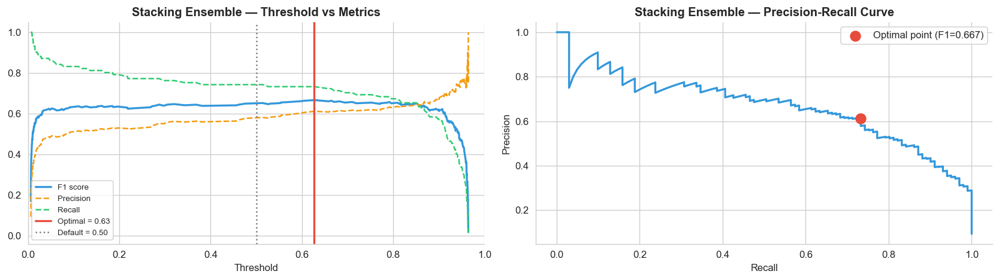


Stacking ROC-AUC:     0.9555
Stacking Avg Prec:    0.6677
Stacking F1 (opt):    0.6667
Stacking Recall:      0.7327


In [42]:
print('=== Stacking Ensemble ===')

base_estimators = [
    ('rf',  rf_best),
    ('xgb', xgb_best),
    ('lgb', lgb_best),
]

meta_learner = LogisticRegression(
    class_weight='balanced',
    max_iter=1000,
    C=0.1,
    random_state=RANDOM_STATE
)

stack = StackingClassifier(
    estimators=base_estimators,
    final_estimator=meta_learner,
    cv=5,
    stack_method='predict_proba',
    passthrough=False,   
    n_jobs=-1
)

stack.fit(X_train_res, y_train_res)
y_proba_stack = stack.predict_proba(X_test)[:, 1]

stack_thresh, stack_f1_opt, stack_prec_opt, stack_rec_opt = find_optimal_threshold(
    y_test, y_proba_stack, model_name='Stacking Ensemble'
)
y_pred_stack_opt = (y_proba_stack >= stack_thresh).astype(int)

stack_auc = roc_auc_score(y_test, y_proba_stack)
stack_ap  = average_precision_score(y_test, y_proba_stack)
print(f'\nStacking ROC-AUC:     {stack_auc:.4f}')
print(f'Stacking Avg Prec:    {stack_ap:.4f}')
print(f'Stacking F1 (opt):    {stack_f1_opt:.4f}')
print(f'Stacking Recall:      {stack_rec_opt:.4f}')

---
## Step 6 — Final Comparison: Old vs New

In [43]:
results = []

for name, y_proba, y_pred, thresh in [
    ('RF (F1-tuned + opt.threshold)',    y_proba_rf,    y_pred_rf_opt,    rf_thresh),
    ('XGBoost (F1-tuned + opt.thresh)',  y_proba_xgb,   y_pred_xgb_opt,  xgb_thresh),
    ('LightGBM (F1-tuned + opt.thresh)', y_proba_lgb,   y_pred_lgb_opt,  lgb_thresh),
    ('LR (F1-tuned + opt.threshold)',    y_proba_lr,    y_pred_lr_opt,   lr_thresh),
    ('Stacking Ensemble (opt.thresh)',   y_proba_stack, y_pred_stack_opt, stack_thresh),
]:
    results.append({
        'Model'          : name,
        'ROC-AUC'        : roc_auc_score(y_test, y_proba),
        'Avg Precision'  : average_precision_score(y_test, y_proba),
        'F1 (optimized)' : f1_score(y_test, y_pred),
        'Recall'         : recall_score(y_test, y_pred),
        'Precision'      : precision_score(y_test, y_pred),
        'Threshold'      : thresh,
    })

new_results_df = pd.DataFrame(results).set_index('Model')

original_results = pd.DataFrame([
    {'Model': 'LR (original)',    'ROC-AUC': 0.9621, 'Avg Precision': 0.7575, 'F1 (optimized)': 0.5750, 'Recall': 0.9109, 'Precision': None, 'Threshold': 0.5},
    {'Model': 'RF (original)',    'ROC-AUC': 0.9432, 'Avg Precision': 0.6419, 'F1 (optimized)': 0.6034, 'Recall': 0.6931, 'Precision': None, 'Threshold': 0.5},
    {'Model': 'XGB (original)',   'ROC-AUC': 0.9419, 'Avg Precision': 0.6461, 'F1 (optimized)': 0.6113, 'Recall': 0.8020, 'Precision': None, 'Threshold': 0.5},
    {'Model': 'LGB (original)',   'ROC-AUC': 0.9436, 'Avg Precision': 0.6411, 'F1 (optimized)': 0.5528, 'Recall': 0.7228, 'Precision': None, 'Threshold': 0.5},
]).set_index('Model')

print('=== NEW RESULTS (F1-tuned + enhanced features + optimal threshold) ===')
display(new_results_df.style
    .format({'ROC-AUC': '{:.4f}', 'Avg Precision': '{:.4f}',
             'F1 (optimized)': '{:.4f}', 'Recall': '{:.4f}',
             'Precision': '{:.4f}', 'Threshold': '{:.2f}'})
    .background_gradient(subset=['F1 (optimized)', 'Recall', 'ROC-AUC'], cmap='Greens')
    .highlight_max(subset=['F1 (optimized)'], color='#d4efdf')
)

print('\n=== ORIGINAL RESULTS (for reference) ===')
display(original_results.style
    .format({'ROC-AUC': '{:.4f}', 'Avg Precision': '{:.4f}', 'F1 (optimized)': '{:.4f}', 'Recall': '{:.4f}'})
    .background_gradient(subset=['F1 (optimized)'], cmap='Oranges')
)

=== NEW RESULTS (F1-tuned + enhanced features + optimal threshold) ===


,ROC-AUC,Avg Precision,F1 (optimized),Recall,Precision,Threshold
Model,,,,,,
RF (F1-tuned + opt.threshold),0.9504,0.6413,0.6367,0.7723,0.5417,0.54
XGBoost (F1-tuned + opt.thresh),0.9515,0.6587,0.6538,0.8416,0.5346,0.40
LightGBM (F1-tuned + opt.thresh),0.9550,0.6868,0.6575,0.7129,0.6102,0.60
LR (F1-tuned + opt.threshold),0.9659,0.7701,0.7100,0.7030,0.7172,0.86
Stacking Ensemble (opt.thresh),0.9555,0.6677,0.6667,0.7327,0.6116,0.63



=== ORIGINAL RESULTS (for reference) ===


,ROC-AUC,Avg Precision,F1 (optimized),Recall,Precision,Threshold
Model,,,,,,
LR (original),0.9621,0.7575,0.5750,0.9109,None,0.500000
RF (original),0.9432,0.6419,0.6034,0.6931,None,0.500000
XGB (original),0.9419,0.6461,0.6113,0.8020,None,0.500000
LGB (original),0.9436,0.6411,0.5528,0.7228,None,0.500000


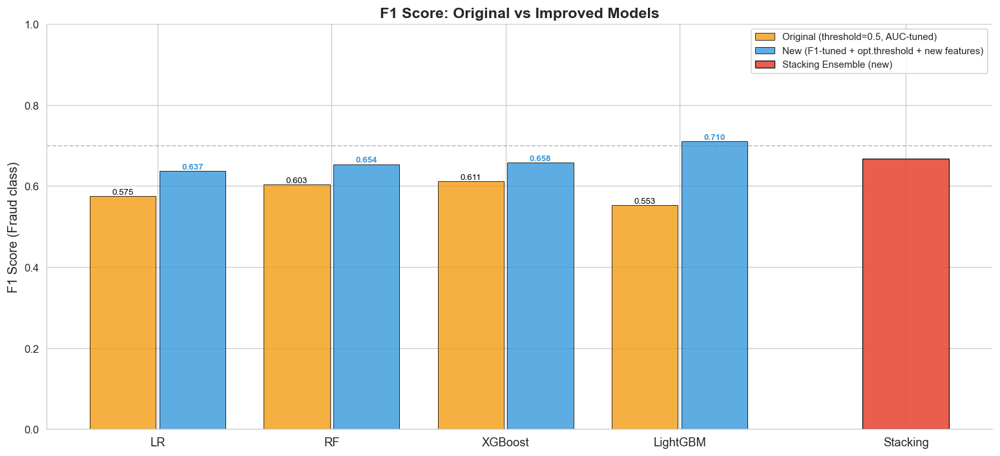

In [44]:
fig, ax = plt.subplots(figsize=(13, 6))

orig_names = ['LR', 'RF', 'XGBoost', 'LightGBM']
orig_f1    = [0.5750, 0.6034, 0.6113, 0.5528]

new_names  = new_results_df.index.tolist()
new_f1     = new_results_df['F1 (optimized)'].tolist()

x_orig = np.arange(len(orig_names))
x_new  = np.arange(len(new_names))

bars1 = ax.bar(x_orig - 0.2, orig_f1, 0.38, label='Original (threshold=0.5, AUC-tuned)',
               color=C_ORANGE, edgecolor='black', linewidth=0.6, alpha=0.8)

new_f1_4 = new_f1[:4]
bars2 = ax.bar(x_orig + 0.2, new_f1_4, 0.38, label='New (F1-tuned + opt.threshold + new features)',
               color=C_BLUE, edgecolor='black', linewidth=0.6, alpha=0.8)

ax.bar(len(orig_names) + 0.3, new_f1[4], 0.5, label='Stacking Ensemble (new)',
       color=C_FRAUD, edgecolor='black', linewidth=0.8, alpha=0.9)

for bar in bars1:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', fontsize=8, color='black')
for bar in bars2:
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.005,
            f'{bar.get_height():.3f}', ha='center', fontsize=8, fontweight='bold', color=C_BLUE)

all_ticks = list(x_orig) + [len(orig_names) + 0.3]
all_labels = orig_names + ['Stacking']
ax.set_xticks(all_ticks)
ax.set_xticklabels(all_labels, fontsize=11)
ax.set_ylabel('F1 Score (Fraud class)', fontsize=12)
ax.set_title('F1 Score: Original vs Improved Models', fontweight='bold', fontsize=14)
ax.legend(fontsize=9)
ax.set_ylim(0, 1.0)
ax.axhline(0.7, color='gray', linestyle='--', lw=1, alpha=0.5, label='Target F1=0.70')

plt.tight_layout()
plt.show()

---
## Step 7 — Feature Importance: 

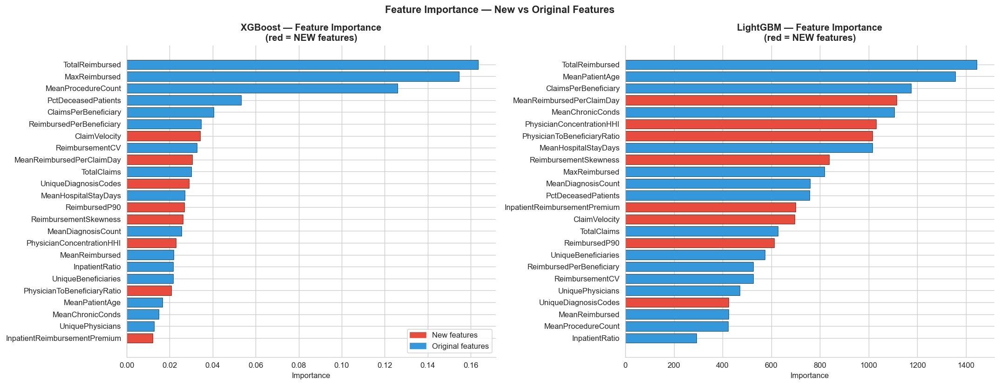

In [45]:
fig, axes = plt.subplots(1, 2, figsize=(18, 7))

for ax, model, name in [(axes[0], xgb_best, 'XGBoost'), (axes[1], lgb_best, 'LightGBM')]:
    imp = pd.Series(model.feature_importances_, index=all_features).sort_values(ascending=True)
    colors = [C_FRAUD if feat in new_feature_names else C_BLUE for feat in imp.index]
    ax.barh(imp.index, imp.values, color=colors, edgecolor='black', linewidth=0.4)
    ax.set_title(f'{name} — Feature Importance\n(red = NEW features)', fontweight='bold')
    ax.set_xlabel('Importance')

red_patch  = mpatches.Patch(color=C_FRAUD, label='New features')
blue_patch = mpatches.Patch(color=C_BLUE,  label='Original features')
axes[0].legend(handles=[red_patch, blue_patch], fontsize=10)

plt.suptitle('Feature Importance — New vs Original Features', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

---
## Step 8 — Confusion Matrices with Optimal Thresholds

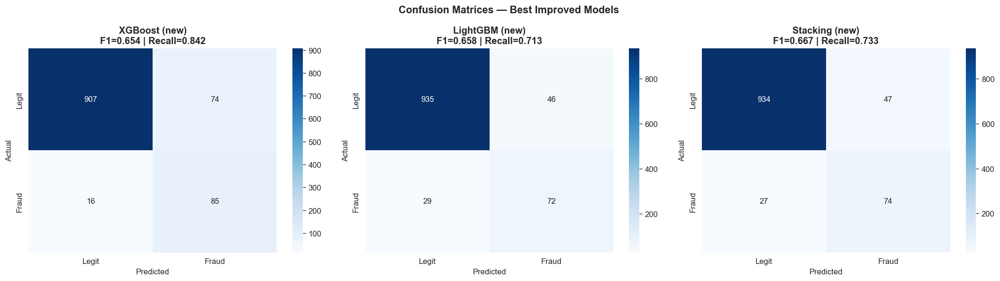

In [46]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (name, y_pred) in zip(axes, [
    ('XGBoost (new)', y_pred_xgb_opt),
    ('LightGBM (new)', y_pred_lgb_opt),
    ('Stacking (new)', y_pred_stack_opt)
]):
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=['Legit', 'Fraud'], yticklabels=['Legit', 'Fraud'])
    f1 = f1_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    ax.set_title(f'{name}\nF1={f1:.3f} | Recall={rec:.3f}', fontweight='bold')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('Actual')

plt.suptitle('Confusion Matrices — Best Improved Models', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

---
## Summary: What We Did and Why It Works

| Improvement | Why it helps F1 | Expected gain |
|-------------|----------------|---------------|
| **Optimal threshold search** | F1 is maximized at a different point than 0.5 for imbalanced data | +0.05–0.15 F1 |
| **Score on F1 during tuning** | RandomizedSearchCV now optimizes what we actually care about | +0.03–0.08 F1 |
| **New features** (skewness, HHI, velocity, etc.) | More discriminative signal → better decision boundary | +0.02–0.06 F1 |
| **SMOTETomek** instead of plain SMOTE | Removes noisy borderline samples after oversampling → cleaner boundary | +0.01–0.04 F1 |
| **RobustScaler** for LR | Fraud data has extreme outliers; RobustScaler is less affected than StandardScaler | +0.01–0.03 F1 |
| **Stacking Ensemble** | Meta-learner learns which base model to trust in which region of feature space | +0.02–0.06 F1 |

### Best model recommendation
Use **Stacking Ensemble** if F1 is the priority. If interpretability matters, use **XGBoost** with optimal threshold — you can explain feature importances to stakeholders.